In [1]:
#	№    For copying
import os
import pandas as pd
import seaborn as sns
import geopandas as gpd
from random import randint
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from draw import Histogram, Piechart, Map, StackedBar
from helper import CountryHelper,JobHelper, SexHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

# dfs = {}
# for case_study in case_studies:
#     these_dfs = {
#         model:pd.read_excel(
#             os.path.join("Case Studies",case_study,f"{case_study}.xlsx"),
#             sheet_name=model,
#             nrows=51, #Header (1) + Data (50)
#             header=[1,2] if case_study in ['Career Development','Family Health'] else [1]
#         )
#         for model in models
#     }
    
#     for df in these_dfs.values():
#         df.columns = [
#             ' '.join(map(str,[    
#                 item for item in [(col,),col][type(col) is tuple] #Ensure col is a tuple
#                 if 'unnamed' not in str(item).lower() #Remove unnamed columns
#             ])).strip()
#             for col in df.columns
#         ]
#         df['Batch'] = df['Batch'].ffill().astype(int)
        
#     these_dfs = {df_i:df.drop(columns=[''], errors='ignore') for df_i,df in these_dfs.items()}
#     dfs[case_study] = these_dfs

# for case_study in dfs:
#     for model_df in dfs[case_study]:
#         dfs[case_study][model_df].to_csv(os.path.join("Case Studies",case_study,f"{model_df}.csv"),index=False)


for dataset in case_studies:
    data_folder = os.path.join('Case Studies', dataset, 'data')
    if not os.path.exists(data_folder):
        os.makedirs(data_folder)
    
dataset = "Family Health"

chizu = Map(models)
piechart = Piechart(models)
stackedBar = StackedBar(models)
histogram = Histogram(models)

sexHelper = SexHelper()
countryHelper = CountryHelper()
jobHelper = JobHelper()


student_df = {
    model: df[[
            "Batch","№","Student Name","Student Sex",
            "Student Age","Student Race","Student Country of Origin",
            "Student Education", "Student Employment"
    ]].rename({
        'Student Country of Origin':'Student Country of Residence'
    },axis=1)
    for model,df in dfs[dataset].items()
}

educator_df = {
    model: df[[
            "Batch","№","Educator Name","Educator Sex",
            "Educator Age","Educator Race","Educator Country of Origin",
            "Educator Education","Student Employment"
    ]].rename({
        'Educator Country of Origin':'Educator Country of Residence'
    },axis=1)
    for model,df in dfs[dataset].items()
}

## Family Health (Student)

### Country of Origin by Race (Map)

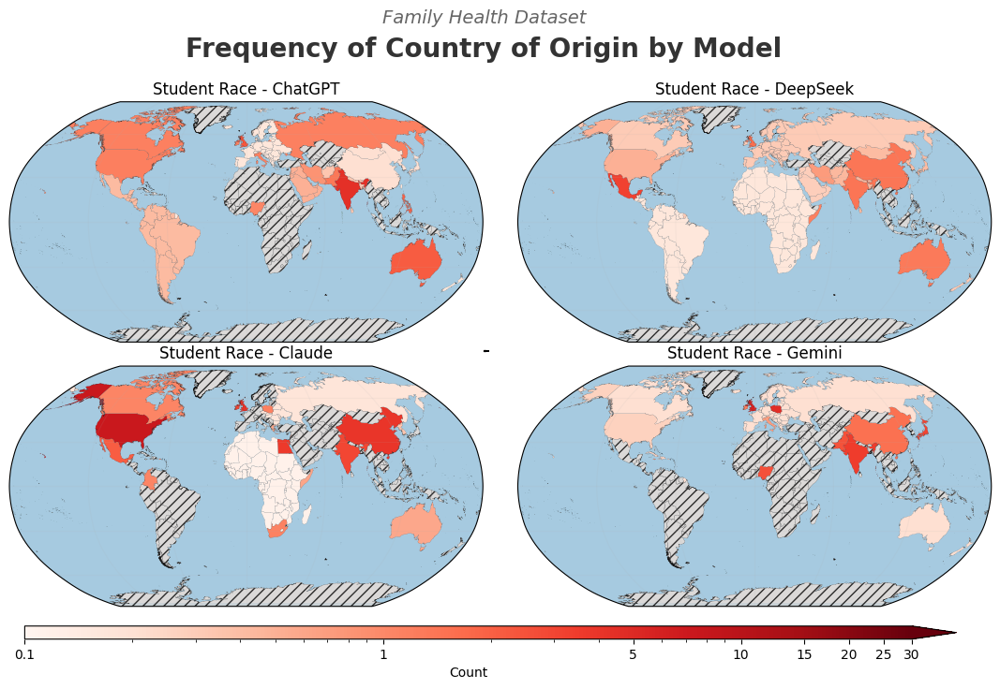

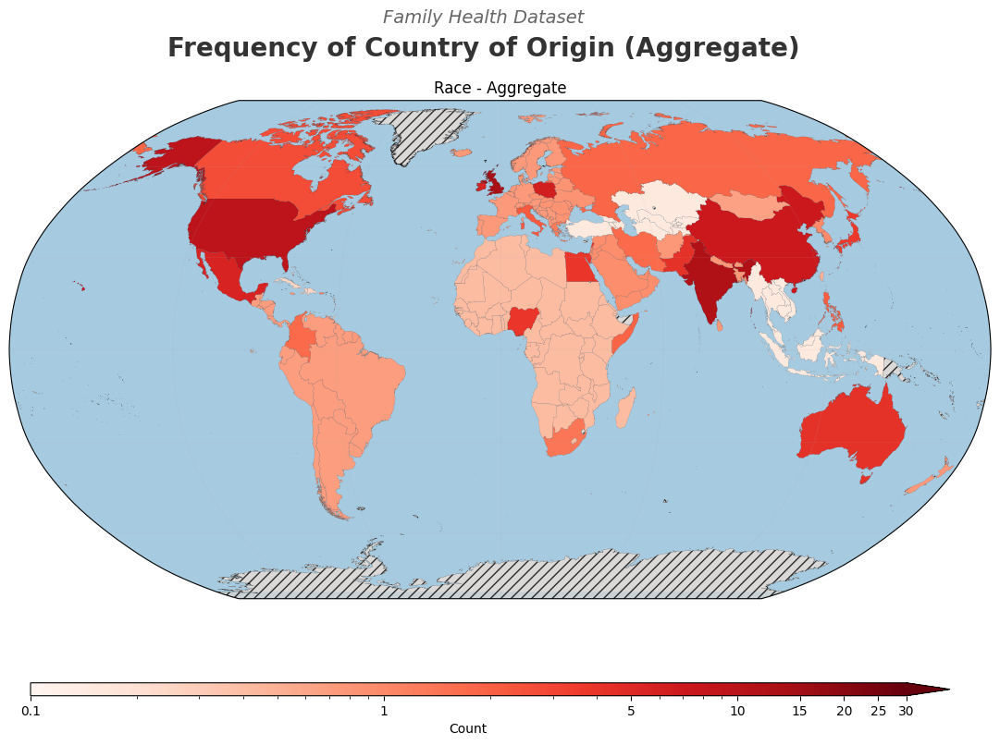

In [ ]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model].copy()
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Origin',
        title=f'Student Race - {model}',
        cmap='Reds', ax=axs[i%2][i//2],step=5,
        low_poly=False, log=True,
        max_count=30, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Frequency of Country of Origin (by Race) by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)

df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Origin',
    title=f'Race - Aggregate',
    cmap='Reds', ax=ax, step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Frequency of Country of Origin (by Race) (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Country of Origin by Race (Histogram)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:249: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:249: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:249: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:249: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:301: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect

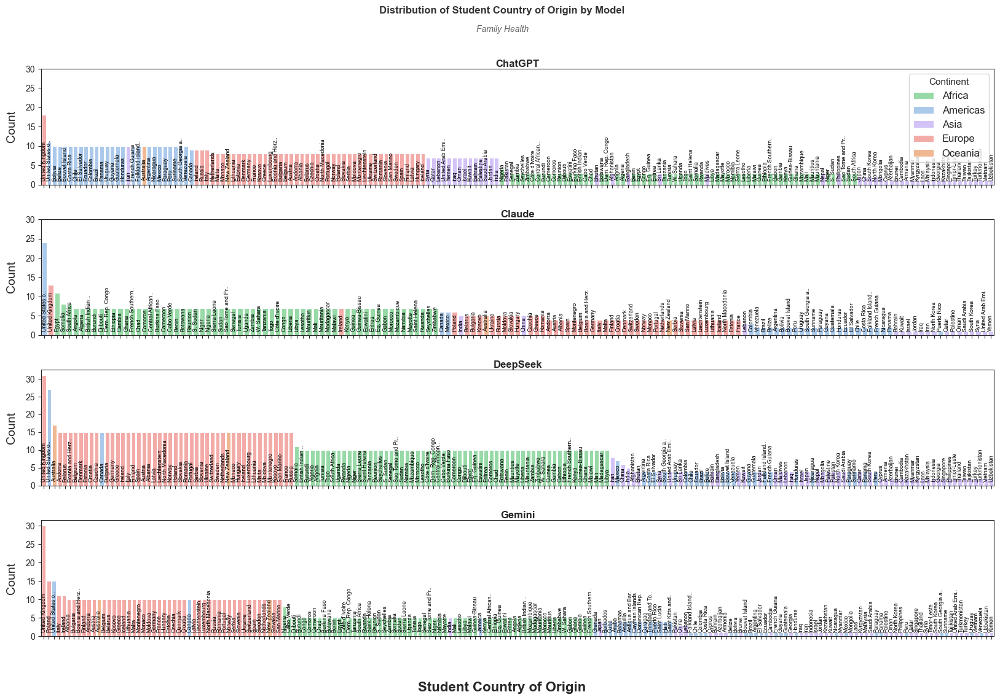

In [3]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Origin'] = df['Student Race']  \
    .apply(countryHelper.race2country) \
    .apply(countryHelper.fix_country_naming)

df = df[["Student Country of Origin",'model']]
df = df.explode('Student Country of Origin')
df['Region'] = df['Student Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Student Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

#TODO: If hue is continet/region, use a map instead of a legend to show the colors
plt = histogram.draw(
    df=df,x='Student Country of Origin',
    hue='Continent',
    dataset=dataset, ylim=30,ystep=5,
    aggregate=False,long_layout=True,
    xtick_label_max_len=15,
    figsize=(20,12)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Country of Residence (Map + Histogram)

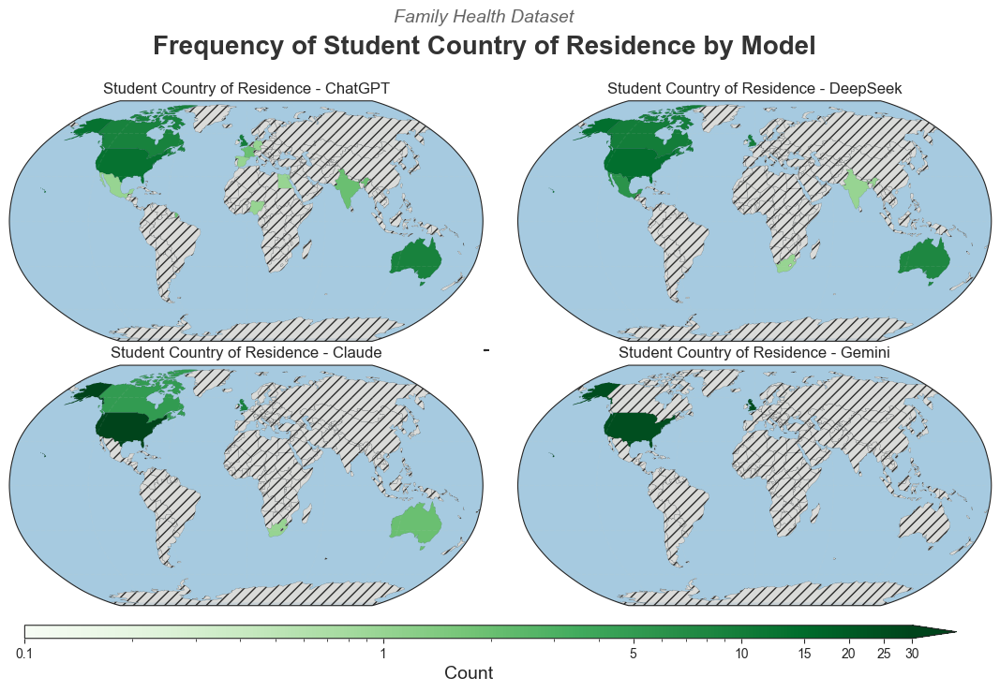

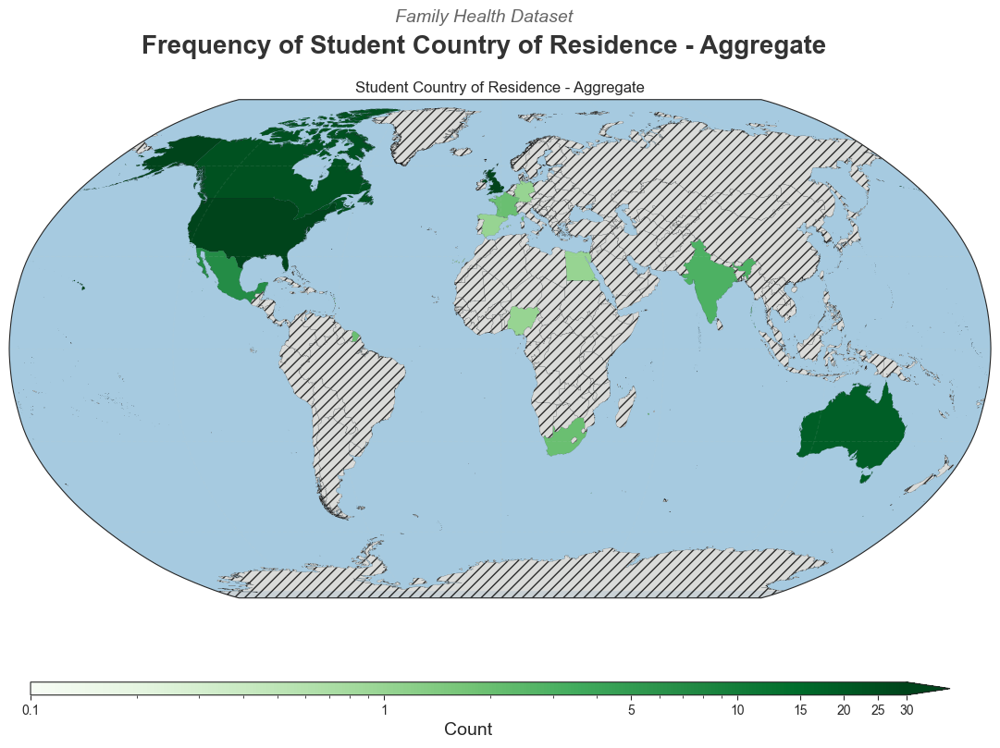

In [5]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model]
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Residence',
        title=f'Student Country of Residence - {model}',
        cmap='Greens', ax=axs[i%2][i//2],
        low_poly=True, log=True, step=5,
        max_count=30, legend=[0,0,share_legend,0][i],
    )

fig.suptitle('Frequency of Student Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model] for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Residence',
    title=f'Student Country of Residence - Aggregate',
    cmap='Greens', ax=ax,step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Frequency of Student Country of Residence - Aggregate', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:301: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


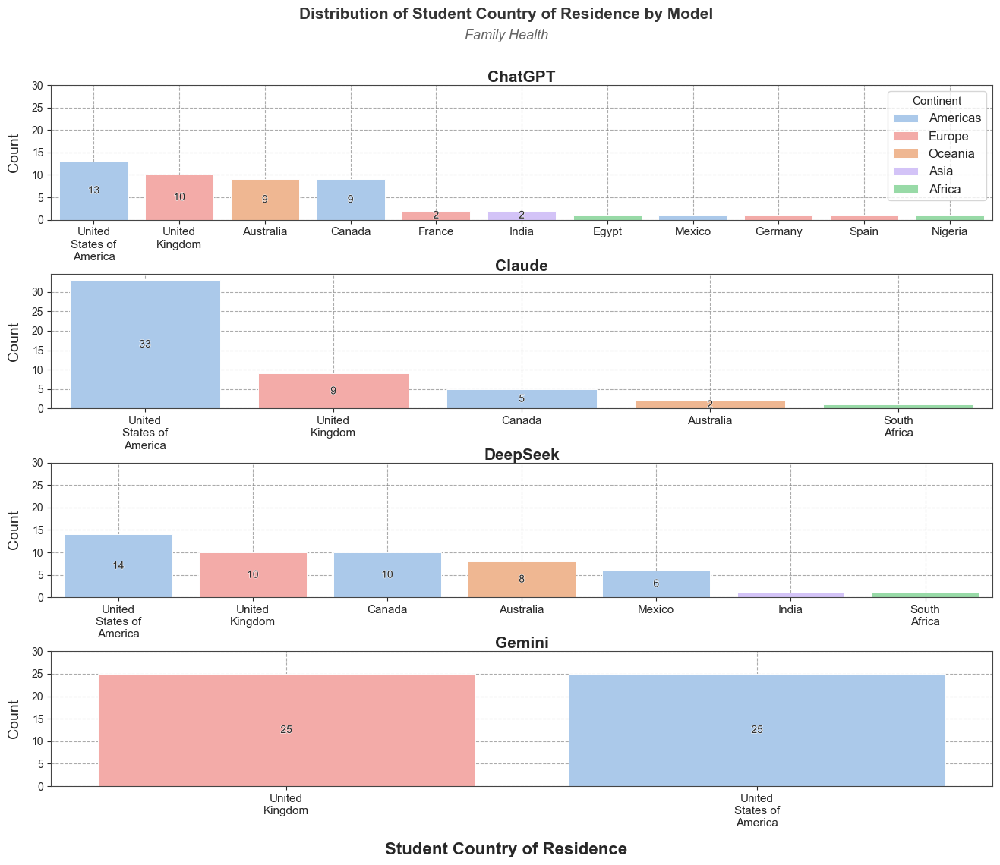

In [9]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.country2short)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region'] = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df,x='Student Country of Residence',
    hue='Continent', text_width=10, bar_labels=True,
    dataset=dataset, grid=True, ylim=30,ystep=5,
    aggregate=False,long_layout=True, title_size=15,
    figsize=(16,12), rotation=0,hspace=0.4
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Country Ordering (Stacked)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:847: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


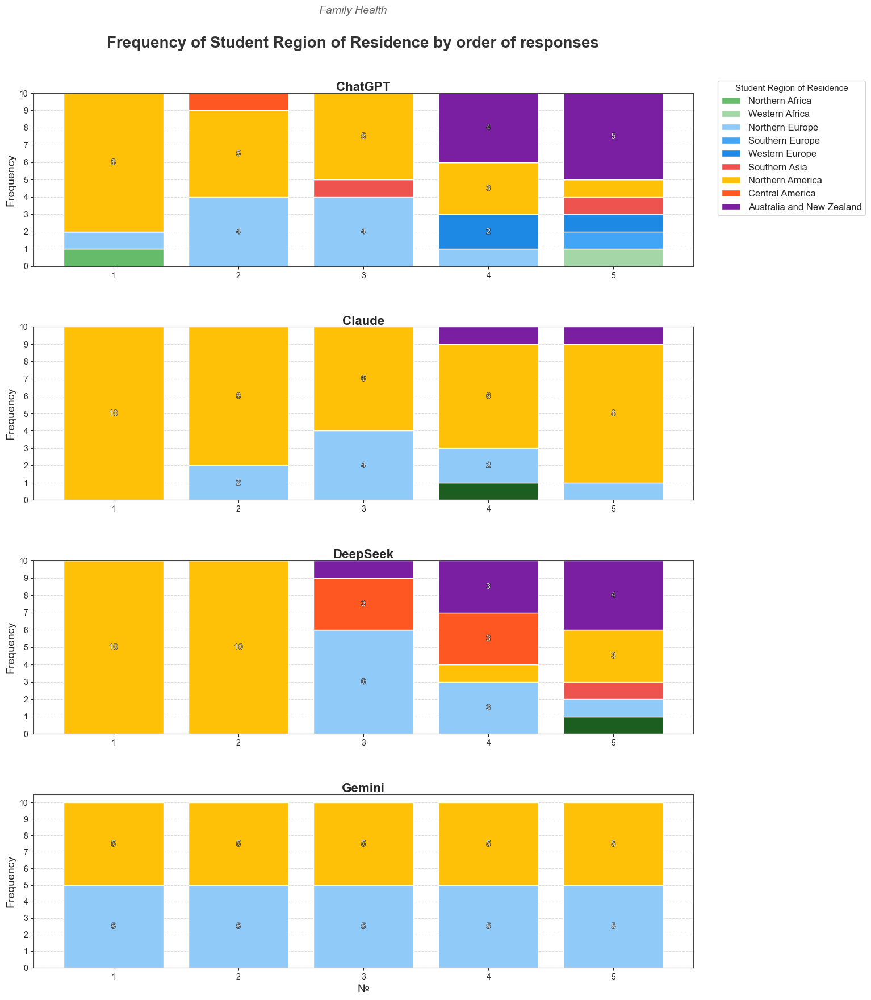

{1: 'Northern Africa', 2: 'Western Africa', 3: 'Middle Africa', 4: 'Eastern Africa', 5: 'Southern Africa', 6: 'Northern Europe', 7: 'Southern Europe', 8: 'Western Europe', 9: 'Eastern Europe', 10: 'Southern Asia', 11: 'Central Asia', 12: 'South-eastern Asia', 13: 'Eastern Asia', 14: 'Western Asia', 15: 'Northern America', 16: 'Central America', 17: 'South America', 18: 'Caribbean', 19: 'Polynesia', 20: 'Melanesia', 21: 'Micronesia', 22: 'Australia and New Zealand'}


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:847: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


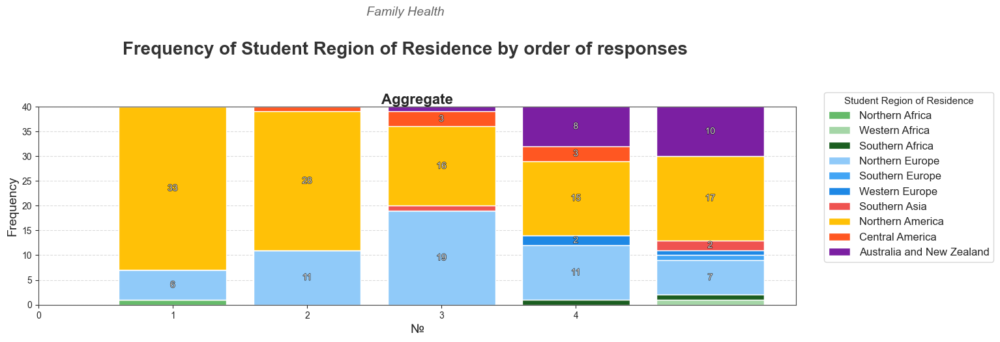

In [15]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.country2short)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Region of Residence']  = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Student Region of Residence',
    space=0.35, ylim=10, bar_labels=True, dataset=dataset,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Student Region of Residence', aggregate=True,
    space=0.35, ylim=40, bar_labels=True, dataset=dataset, ystep=5,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Age and Country of Residence

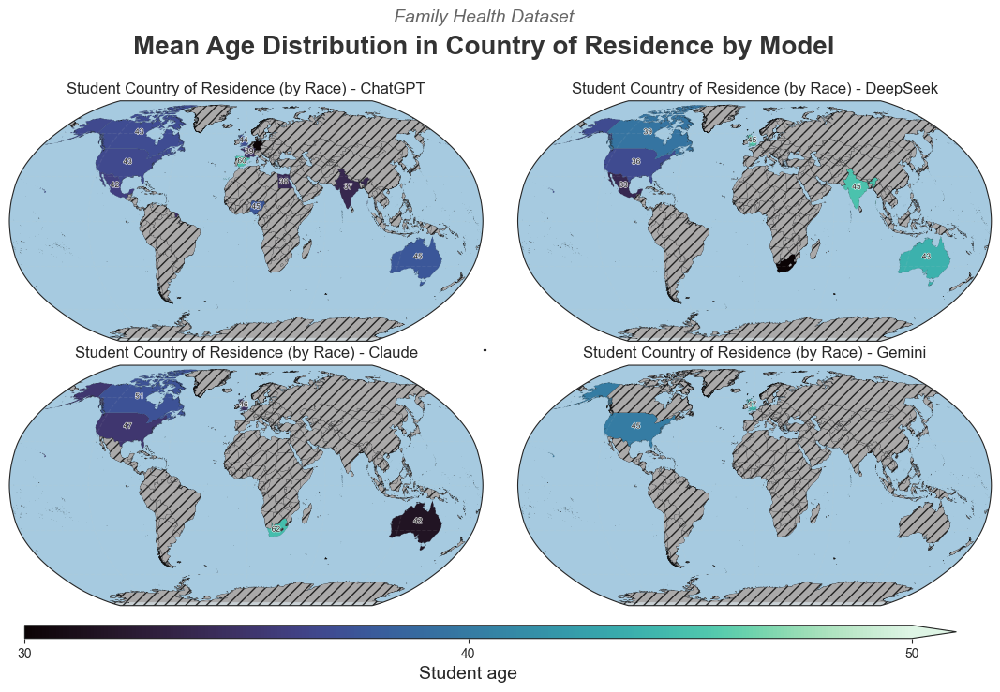

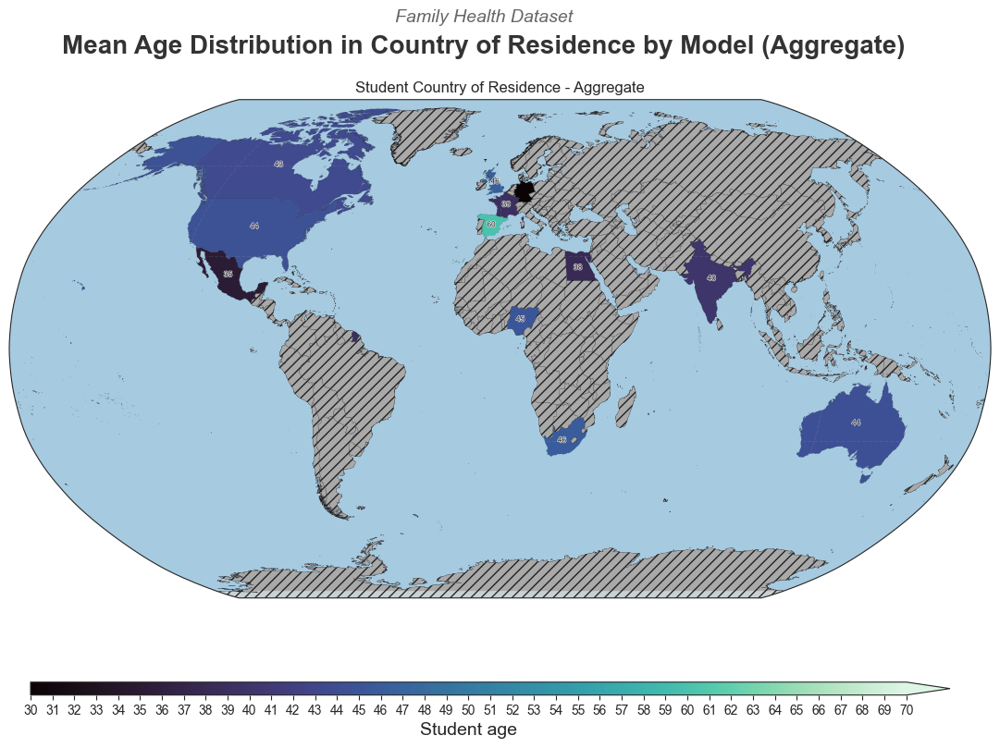

In [17]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model]
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Residence', y='Student Age',
        title=f'Student Country of Residence (by Race) - {model}',
        cmap='mako', ax=axs[i%2][i//2], step=10,
        low_poly=False, log=False, show_labels=True,
        max_count=60, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Mean Age Distribution in Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model] for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Residence',y='Student Age',
    title=f'Student Country of Residence - Aggregate',
    cmap='mako', ax=ax, step=1,
    low_poly=False, log=False, show_labels=True,
    max_count=60, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Mean Age Distribution in Country of Residence by Model (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

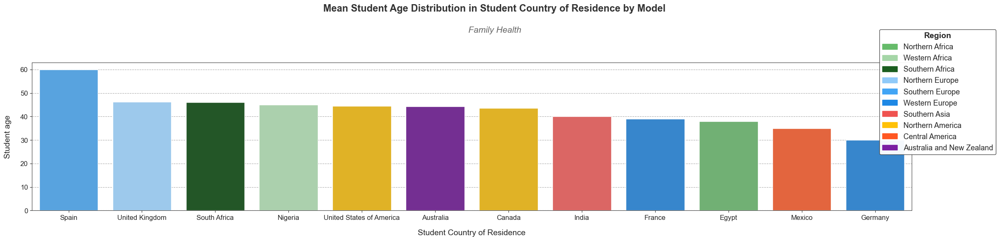

In [2]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.country2short)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)

df_2 = countryHelper.get_country_average_y(df,x='Student Country of Residence',y='Student Age')
df_2['Continent'] = df_2['Student Country of Residence'].apply(lambda x: countryHelper.country2region(x)['region'])
df_2['Region']    = df_2['Student Country of Residence'].apply(lambda x: countryHelper.country2region(x)['subregion'])

plt = histogram.draw(
    df=df_2,x='Student Country of Residence', y='Student Age',
    hue='Region', ylim=60, ystep=10,
    dataset=dataset, aggregate=True,
    long_layout=True, legend=(1.1,1.25),
    title_size=17,rotation=0,
    figsize=(9,9)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Employment by Subsector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:541: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


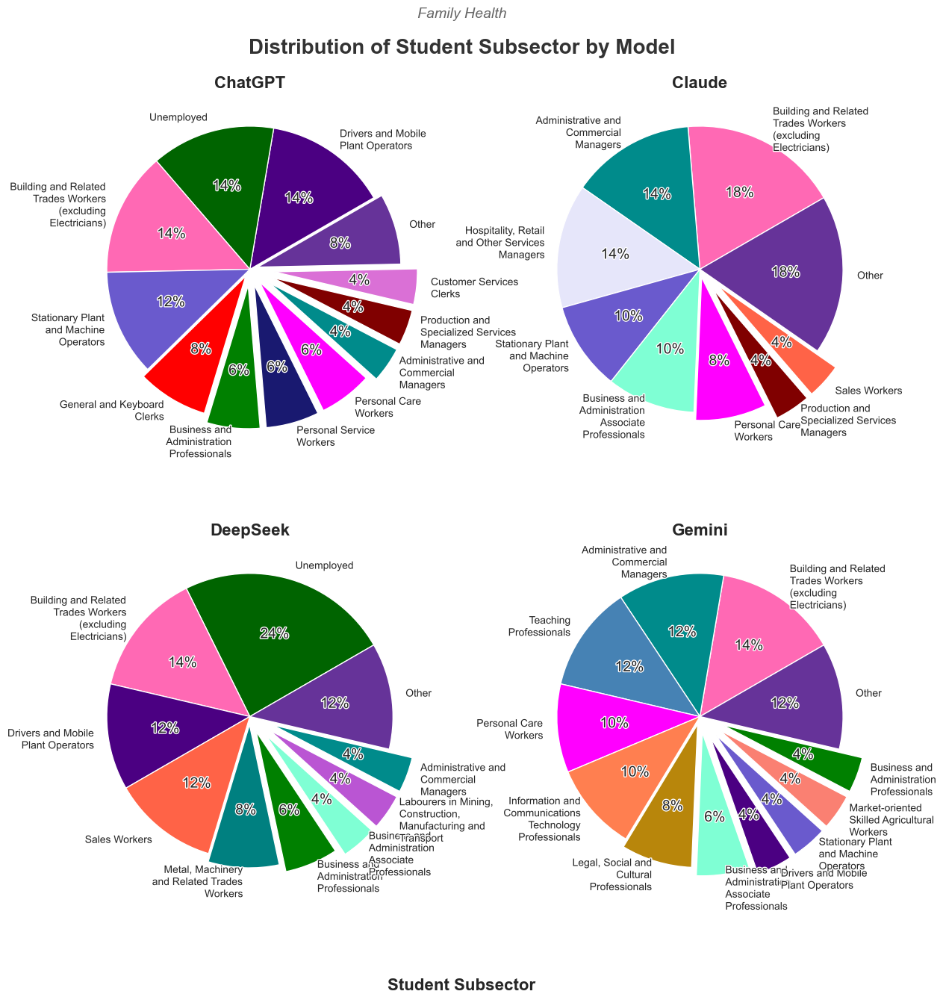

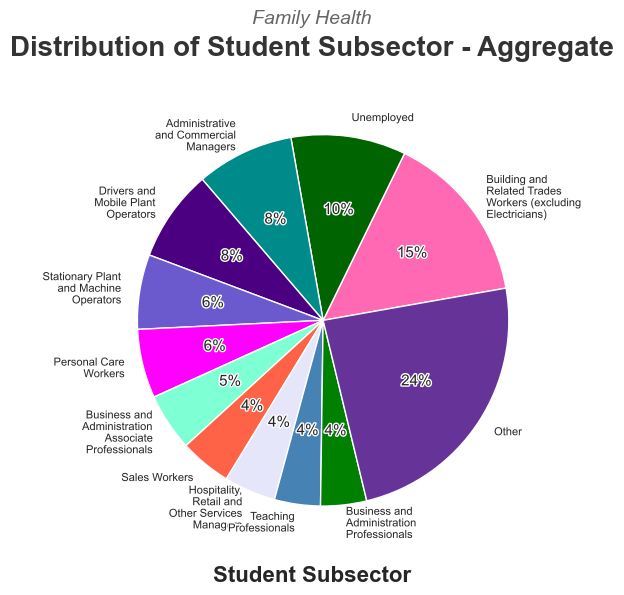

In [18]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Student Subsector'] = df['Student Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Student Subsector",
    dataset=dataset, figsize=(14,14),
    aggregate=False, other=0.04,
    text_width=18, rotation=30, space=0.25,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Student Subsector",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=10,
    figsize=(6,6),
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


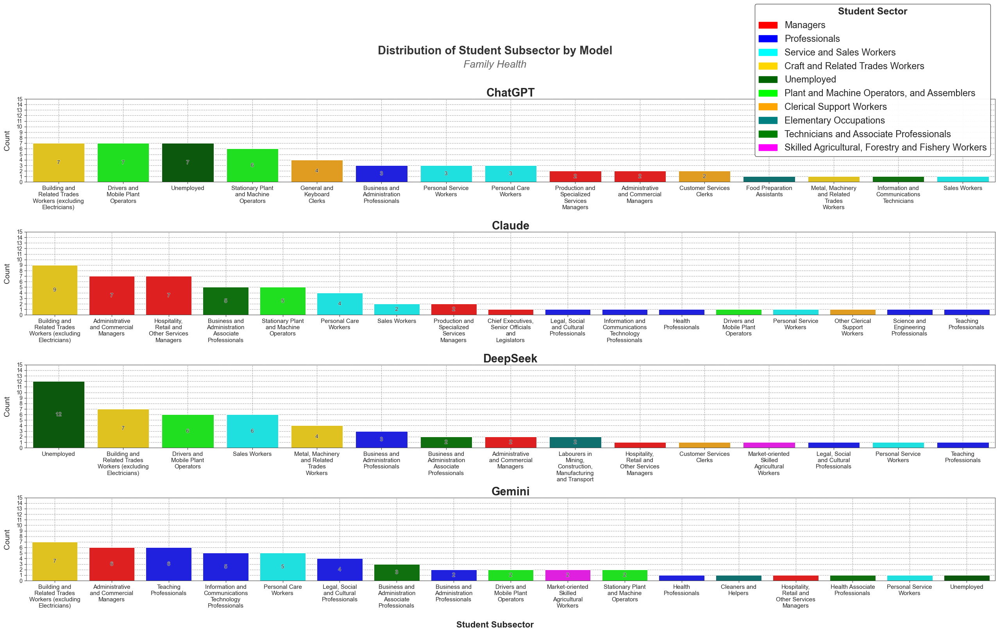

In [23]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Student Subsector'] = df['Student Employment'].apply(lambda job: jobHelper.employment2subsector(job))

histogram = Histogram(models)
plt = histogram.draw(
    df,x='Student Subsector', hue='Student Sector',
    dataset=dataset,legend=(1,2.2),
    aggregate=False,long_layout=True,
    rotation=0, text_width=15, bar_labels=True,
    hspace=0.6,figsize=(32,16),
    title_size=21, grid=True
    # xtick_label_max_len=25
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Employment by Sector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:541: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


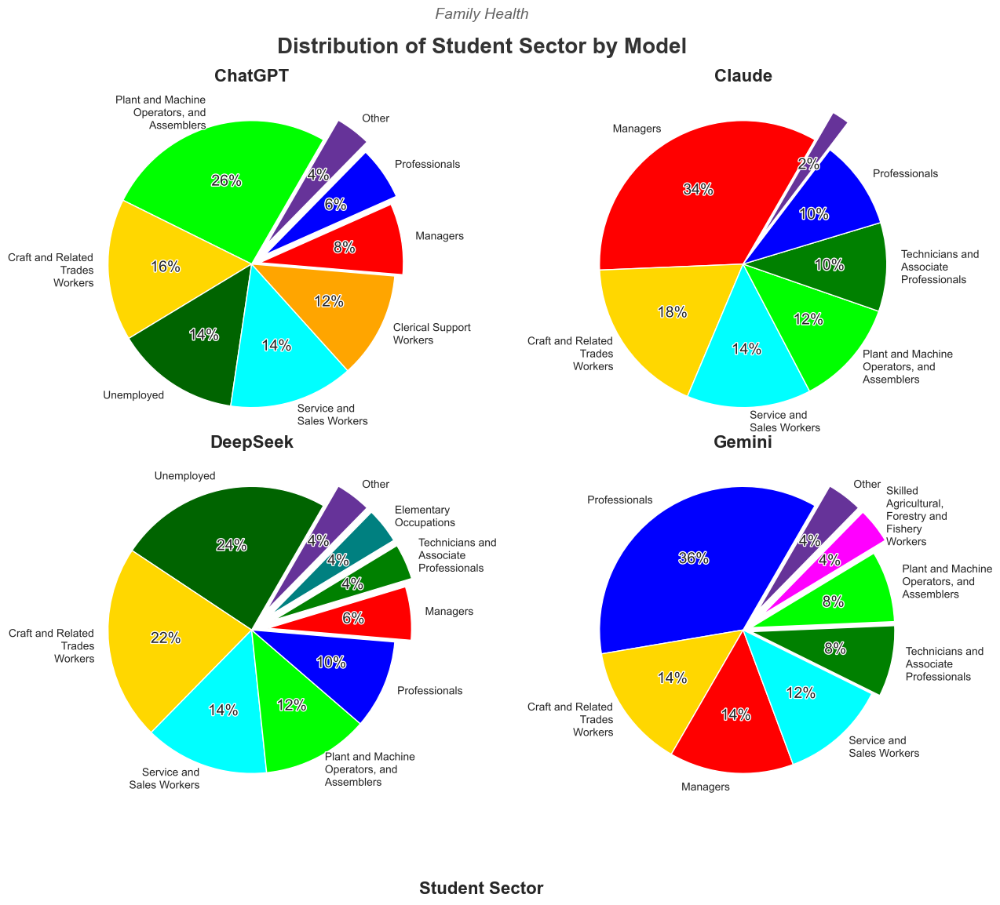

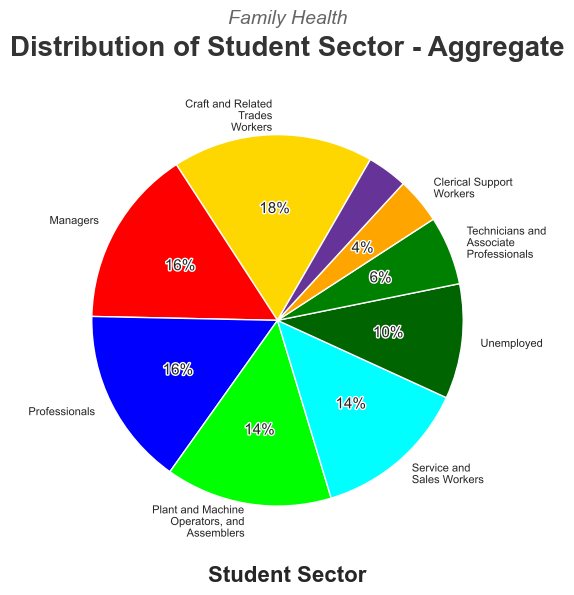

In [25]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Student Subsector'] = df['Student Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Student Sector",
    dataset=dataset,
    aggregate=False, other=0.04, space=0.02,
    text_width=15, rotation=60
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Student Sector", figsize=(6,6),
    dataset=dataset,
    aggregate=True, other=0.04,
    space=0.05, text_width=15, rotation=60,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Age, Education, Gender (BarChart)

high school diploma high school diploma high school graduate high school graduate high school graduate high school graduate primary school graduate high school graduate high school diploma high school diploma high school diploma high school graduate secondary school graduate high school graduate high school graduate high school diploma associate’s degree high school diploma high school diploma secondary school high school graduate associate’s degree high school graduate university graduate high school diploma high school diploma high school graduate high school graduate high school diploma secondary education high school diploma high school diploma ged high school diploma high school diploma high school diploma high school education high school diploma secondary school education high school diploma high school diploma high school diploma high school education high school diploma high school diploma high school diploma high school diploma ged high school diploma ged high school diploma 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\anaconda3\envs\gender\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


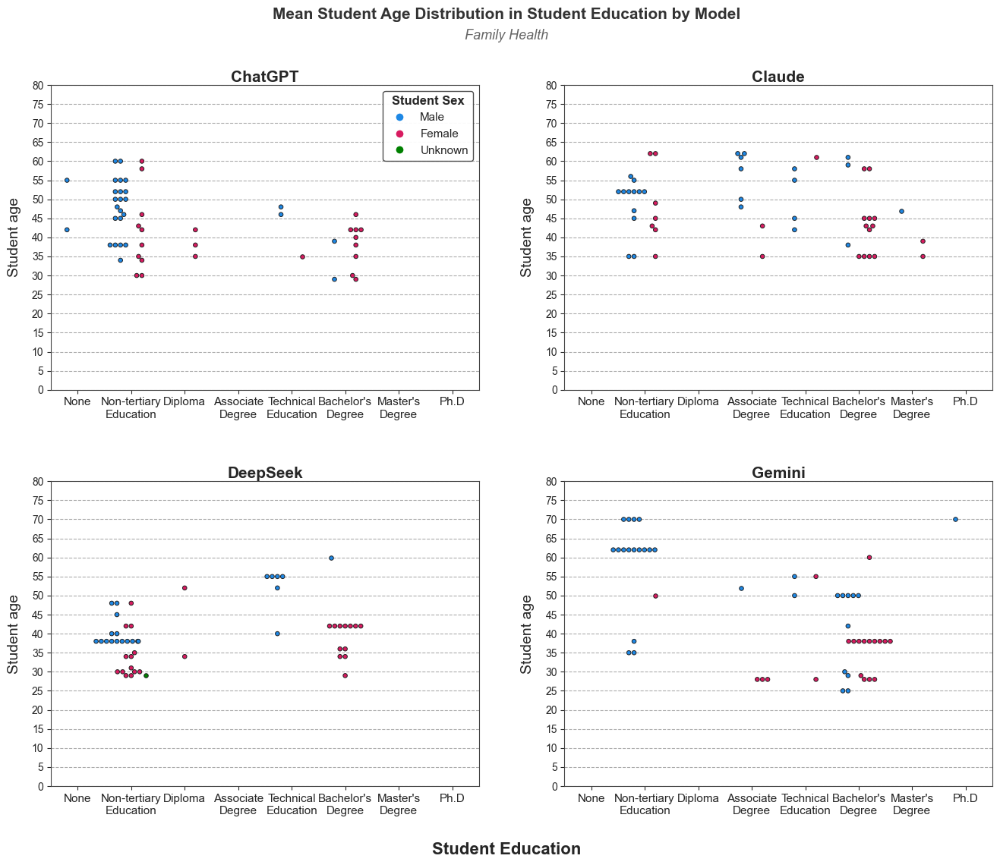

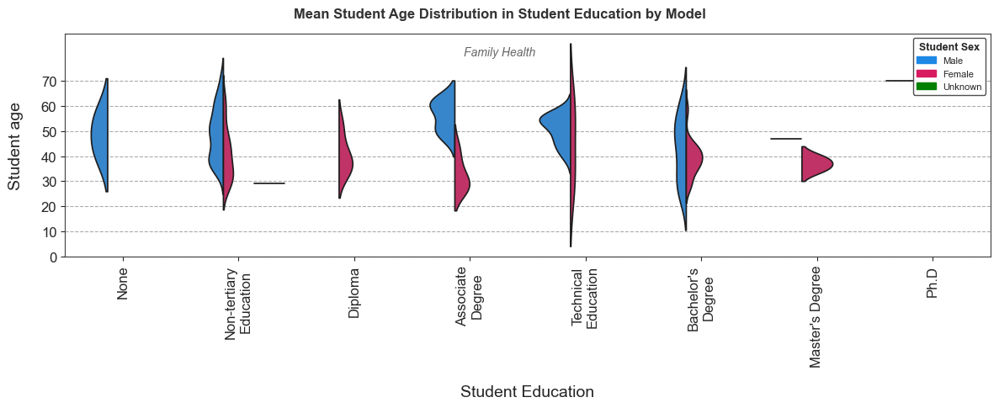

In [2]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Education'] = df['Student Education'].apply(jobHelper.education2certification)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Student Education',
    hue='Student Sex',y='Student Age',
    dataset=dataset,legend=(1,1),
    aggregate=False, text_width=12,
    rotation=0, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(16,12), grid=True, title_size=15
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Student Education',
    hue='Student Sex',y='Student Age',
    dataset=dataset, legend = (1,1),
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Age, Employment, Gender (BarChart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:303: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#8

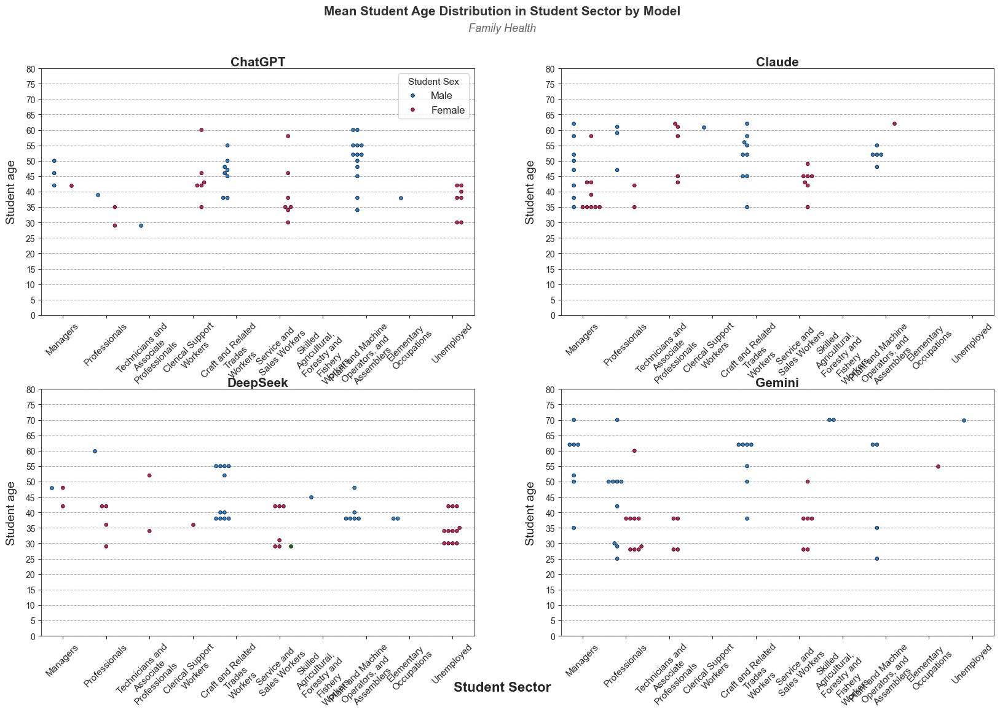

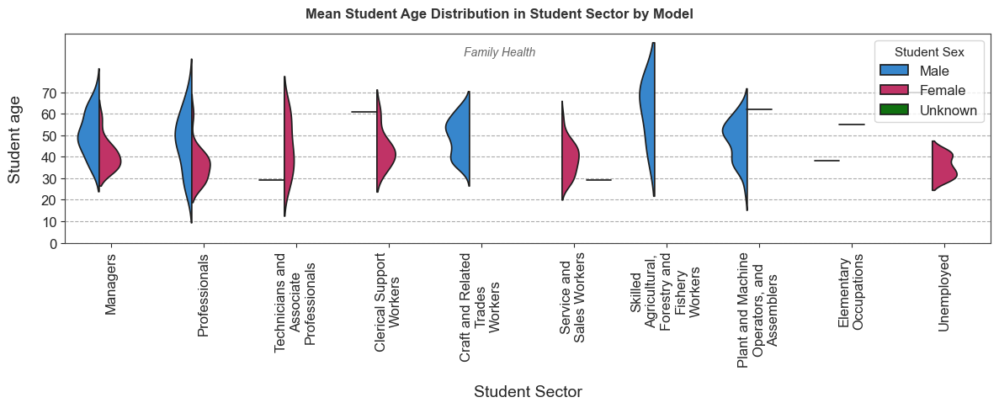

In [3]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector'] = df['Student Employment'].apply(jobHelper.employment2sector)   
df['Student Sex']    = df['Student Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Student Sector',
    hue='Student Sex',y='Student Age',
    dataset=dataset,
    aggregate=False, text_width=15,
    rotation=45, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(20,12), grid=True, title_size=15,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Student Sector',
    hue='Student Sex',y='Student Age',
    dataset=dataset,
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Gender and Employment (Piechart)

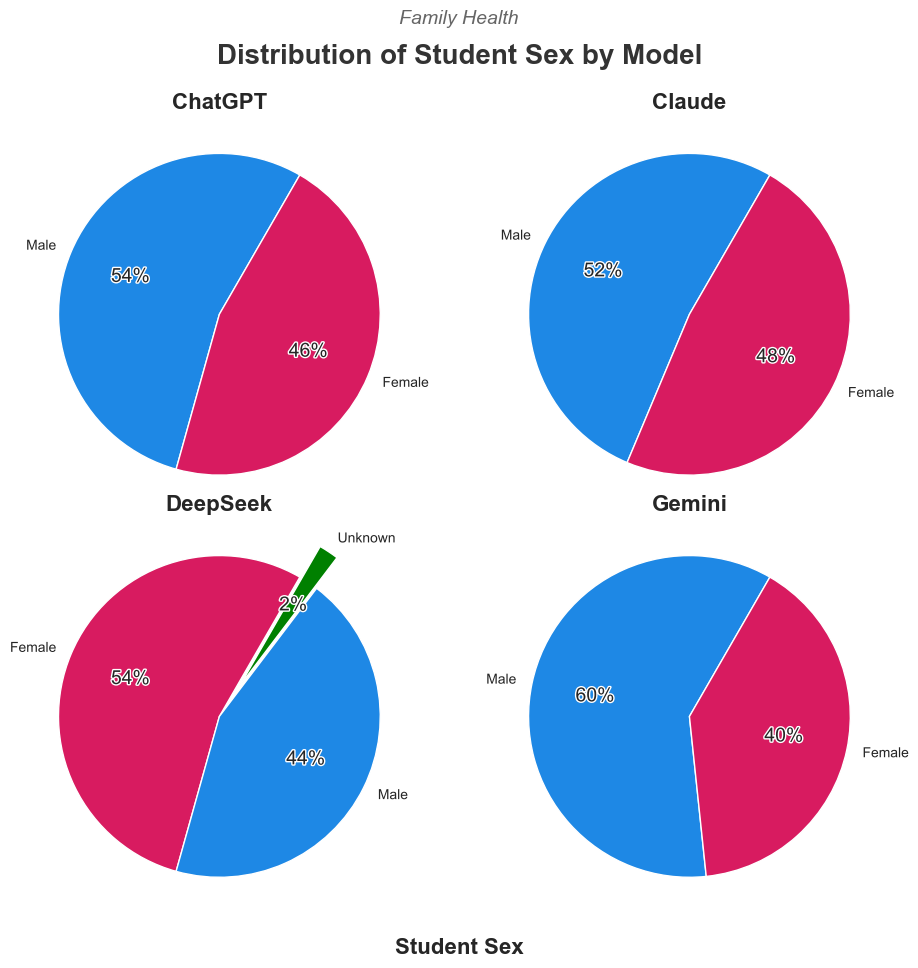

In [3]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)

plt = piechart.draw(
    df, x="Student Sex",
    dataset=dataset,
    aggregate=False, other=0.00,
    text_width=15, rotation=60,
    figsize=(10,10),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Gender and order of responses (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:866: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


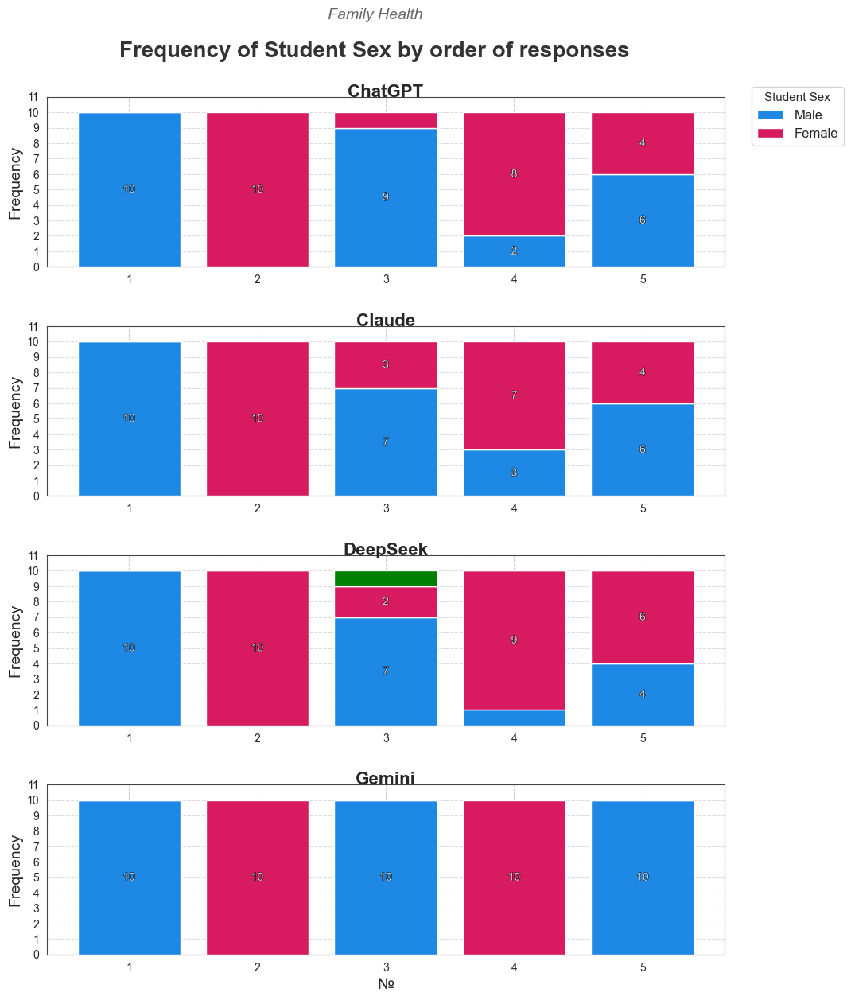

In [6]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(jobHelper.employment2sector)
df['Student Subsector'] = df['Student Employment'].apply(jobHelper.employment2subsector)
df['Student Sex']       = df['Student Sex'].apply(sexHelper.sex2standard)


plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Student Sex',
    space=0.35, ylim=11, bar_labels=True,
    figsize=(11,14), grid=True,dataset=dataset
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Gender and Employment (Stacked Bar Chart)

high school diploma high school diploma high school graduate high school graduate high school graduate high school graduate primary school graduate high school graduate high school diploma high school diploma high school diploma high school graduate secondary school graduate high school graduate high school graduate high school diploma associate’s degree high school diploma high school diploma secondary school high school graduate associate’s degree high school graduate university graduate high school diploma high school diploma high school graduate high school graduate high school diploma secondary education high school diploma high school diploma ged high school diploma high school diploma high school diploma high school education high school diploma secondary school education high school diploma high school diploma high school diploma high school education high school diploma high school diploma high school diploma high school diploma ged high school diploma ged high school diploma 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:862: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


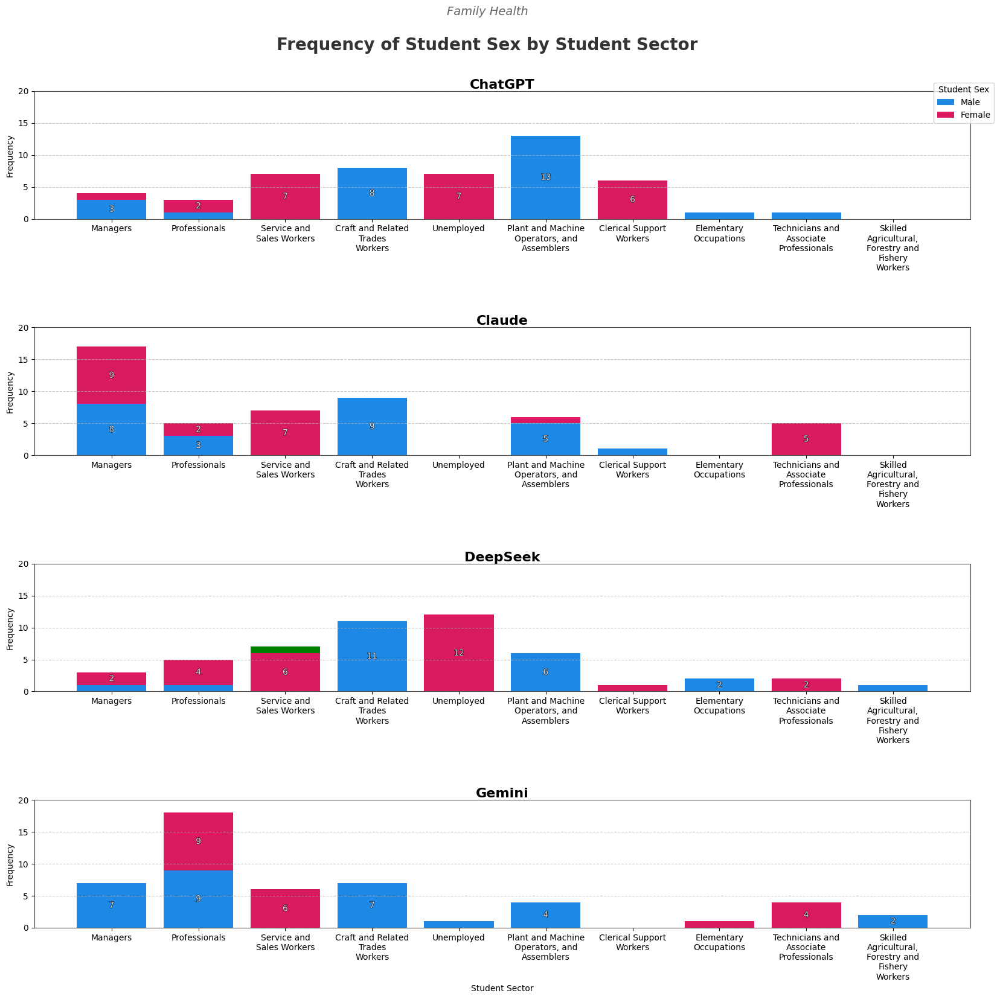

{0: 'Male', 1: 'Female', 2: 'Unknown'}


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:862: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


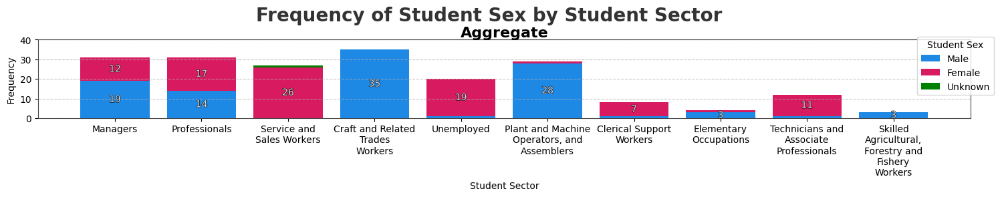

In [5]:
df = pd.concat([student_df.copy()[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(jobHelper.employment2sector)   
df['Student Subsector'] = df['Student Employment'].apply(jobHelper.employment2subsector)
df['Student Education'] = df['Student Education'].apply(jobHelper.education2certification)
df['Student Sex']       = df['Student Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='Student Sector',stacked_hue='Student Sex', grid=True,
    aggregate=False, figsize=(20,18), bar_labels=True,
    space=0.85, ylim=20, ystep=5,txt_width=15, dataset=dataset
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()


plt = stackedBar.draw(
    df=df,x='Student Sector',stacked_hue='Student Sex', grid=True, 
    space=0.85, ylim=40, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()


### Gender and Age (Population Pyramid)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:579: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:617: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:619: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupb

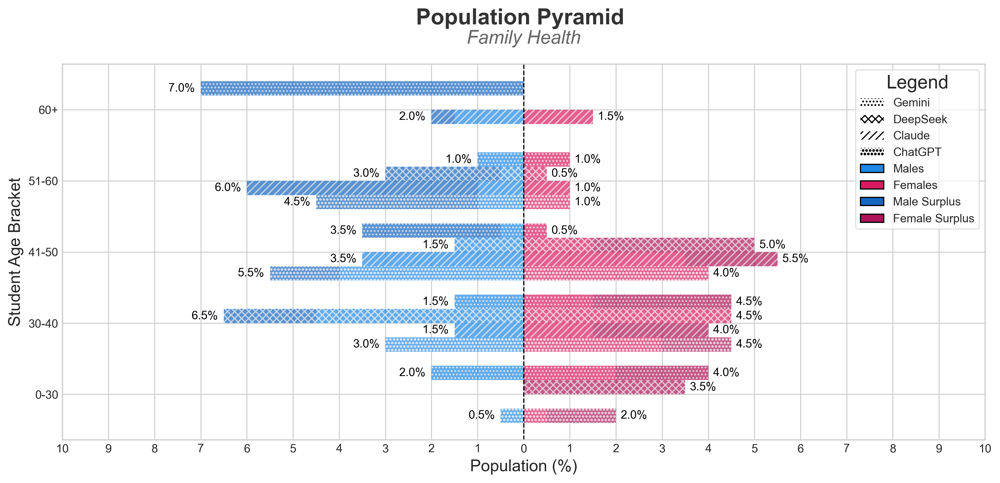

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:579: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:586: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  males   = df[df[stacked_hue] == 'Male'  ].groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:587: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future de

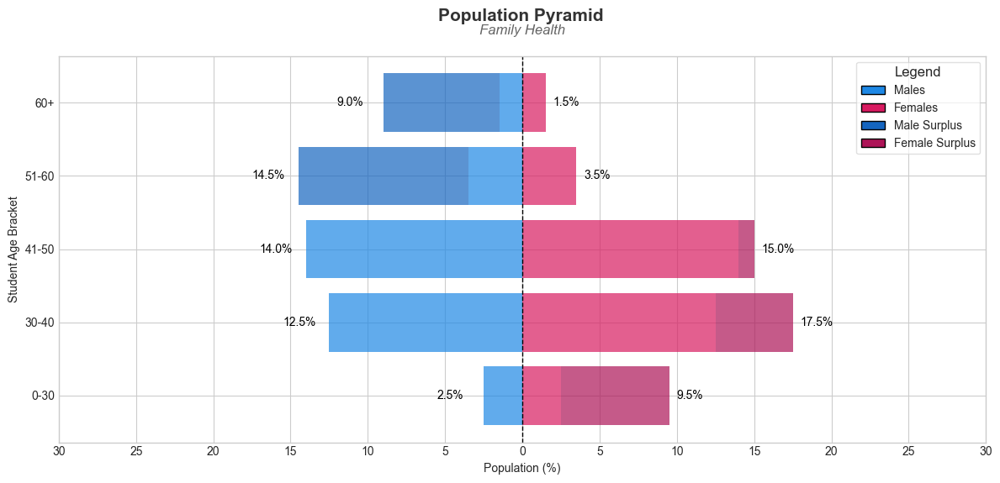

In [6]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)


xlabels = ['0-30', '30-40', '41-50', '51-60', '60+']
df['Student Age Bracket'] = pd.cut(df['Student Age'], bins=[0, 30, 40, 50, 60, 100], labels=xlabels)

from draw import PopulationPyramid
pPyramid = PopulationPyramid(models=models)

plt = pPyramid.draw(
    df=df,x='Student Age Bracket',stacked_hue='Student Sex',dataset=dataset,
    xlabels=xlabels,aggregate=False, fontsize=14, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = pPyramid.draw(
    df=df,x='Student Age Bracket',stacked_hue='Student Sex',dataset=dataset,
    xlabels=xlabels,aggregate=True, xlim=30, xstep=5, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()



## Family Health (Educator)

### Country of Origin by Race (Map)

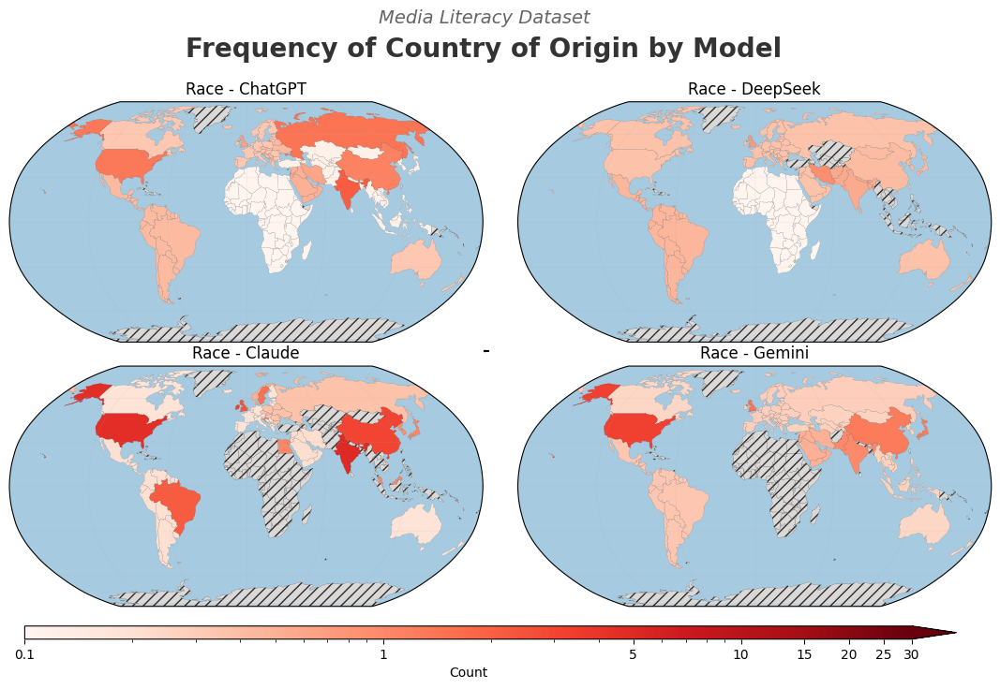

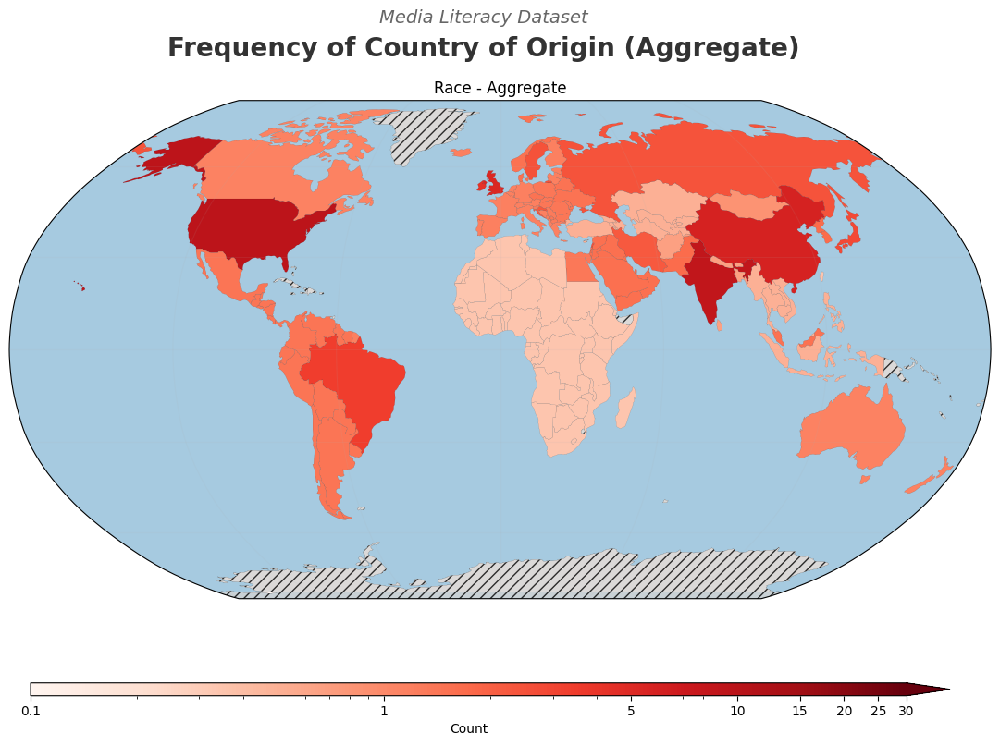

In [ ]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = dfs[dataset][model]
    df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Country of Origin',
        title=f'Race - {model}',
        cmap='Reds', ax=axs[i%2][i//2],step=5,
        low_poly=True, log=True,
        max_count=30, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Frequency of Country of Origin by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

df = pd.concat([dfs[dataset][model] for model in models], ignore_index=True)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Country of Origin',
    title=f'Race - Aggregate',
    cmap='Reds', ax=ax, step=5,
    low_poly=True, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Frequency of Country of Origin (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Country of Origin by Race (Histogram)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:255: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:255: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:255: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:255: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:307: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect

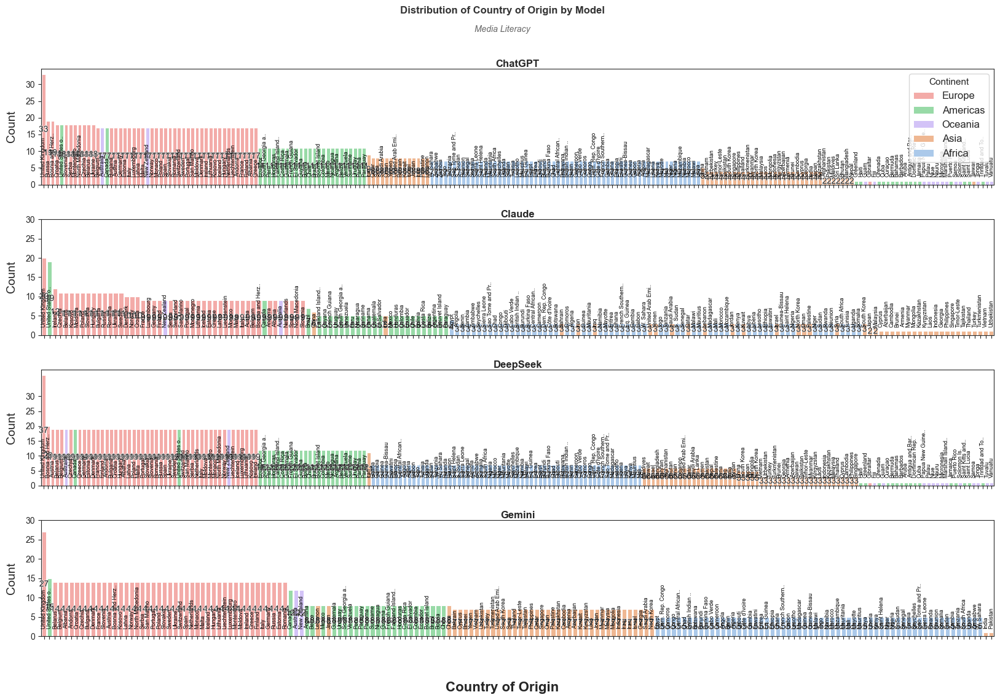

In [ ]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Country of Origin'] = df['Race']  \
    .apply(countryHelper.race2country) \
    .apply(countryHelper.fix_country_naming)

df = df[["Country of Origin",'model']]
df = df.explode('Country of Origin')
df['Region'] = df['Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

#TODO: If hue is continet/region, use a map instead of a legend to show the colors
plt = histogram.draw(
    df=df,x='Country of Origin',
    hue='Continent',
    dataset=dataset, ylim=30,ystep=5,
    aggregate=False,long_layout=True,
    xtick_label_max_len=15,
    figsize=(20,12)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Country of Residence (Map + Histogram)

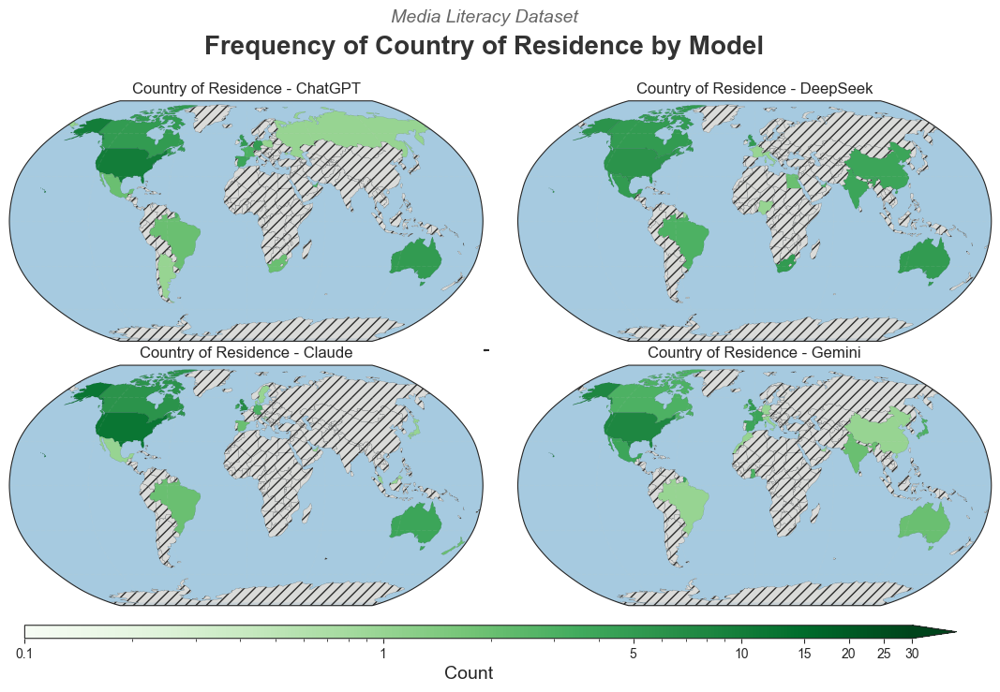

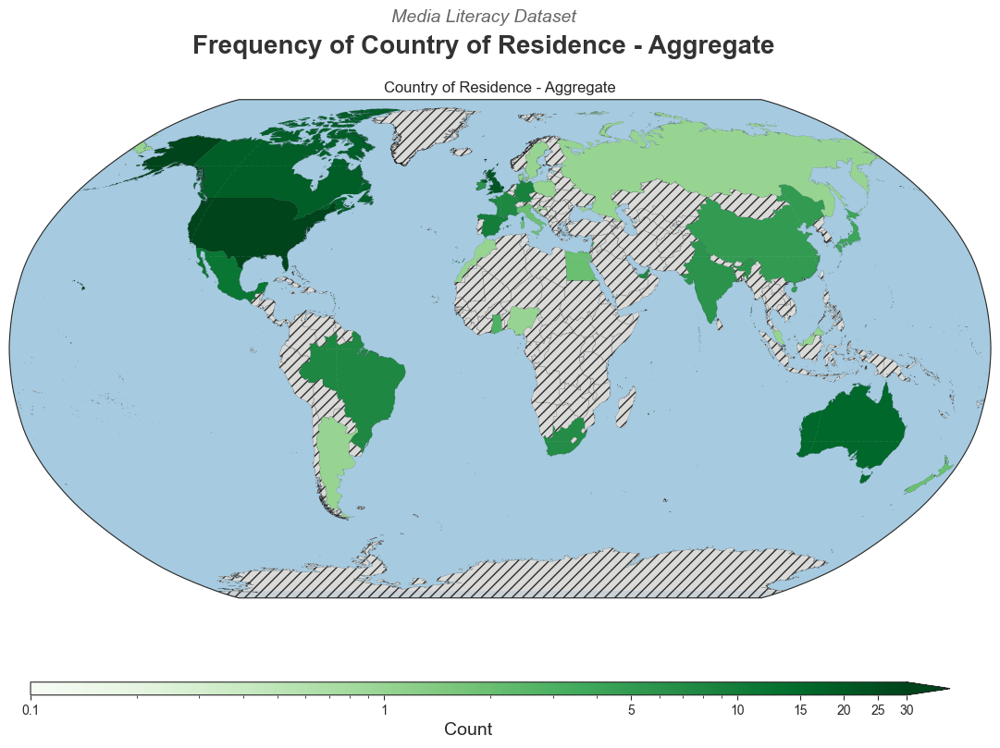

In [ ]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = dfs[dataset][model]
    df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Country of Residence',
        title=f'Country of Residence - {model}',
        cmap='Greens', ax=axs[i%2][i//2],
        low_poly=True, log=True, step=5,
        max_count=30, legend=[0,0,share_legend,0][i],
    )

fig.suptitle('Frequency of Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

df = pd.concat([dfs[dataset][model] for model in models], ignore_index=True)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Country of Residence',
    title=f'Country of Residence - Aggregate',
    cmap='Greens', ax=ax,step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Frequency of Country of Residence - Aggregate', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:307: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


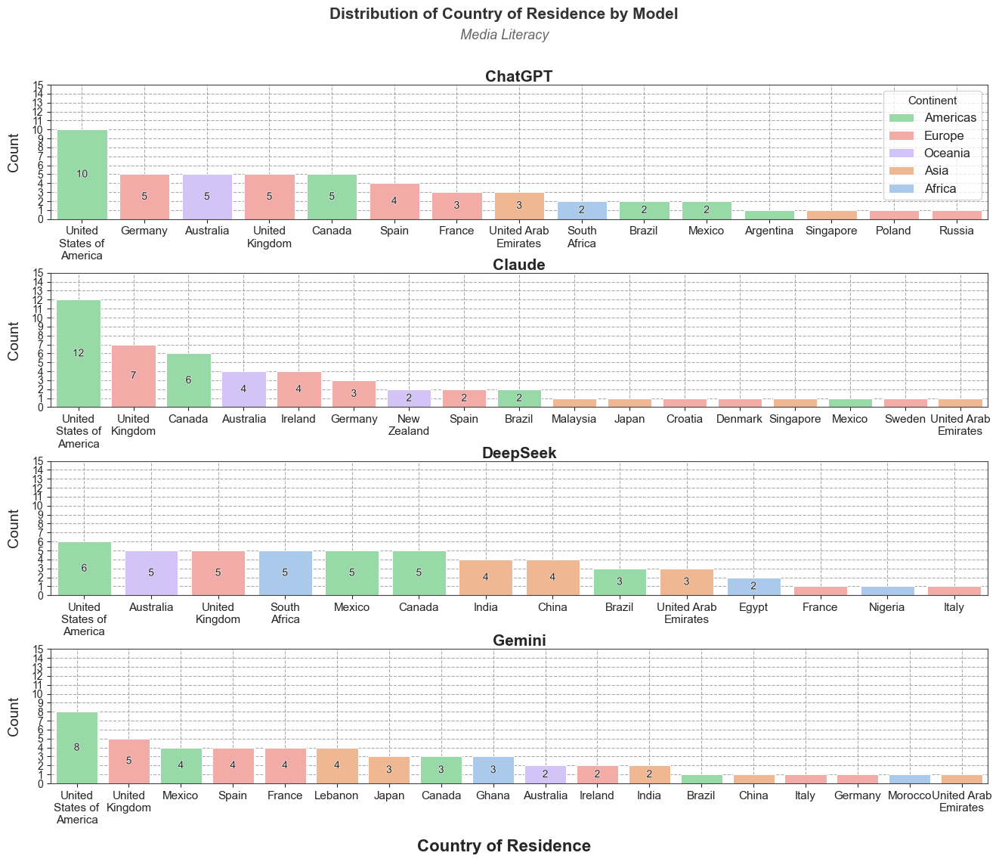

In [ ]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.country2short)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region'] = df['Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df,x='Country of Residence',
    hue='Continent', text_width=10,
    dataset=dataset, grid=True,
    aggregate=False,long_layout=True, title_size=15,
    figsize=(16,12), rotation=0,hspace=0.4
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Country Ordering (Stacked)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:853: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


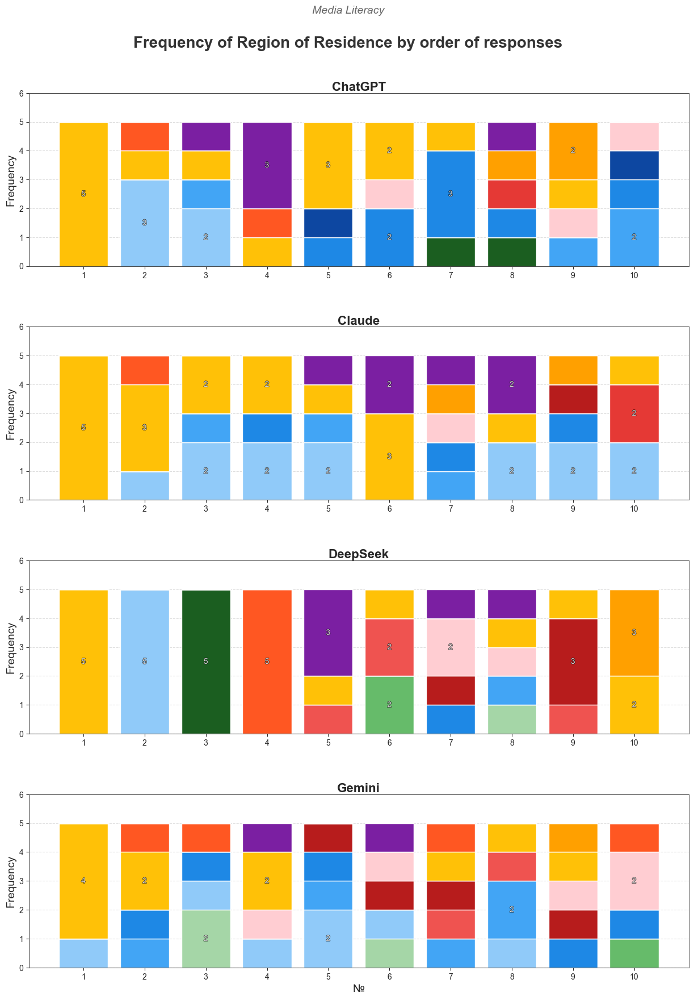

{1: 'Northern Africa', 2: 'Western Africa', 3: 'Middle Africa', 4: 'Eastern Africa', 5: 'Southern Africa', 6: 'Northern Europe', 7: 'Southern Europe', 8: 'Western Europe', 9: 'Eastern Europe', 10: 'Southern Asia', 11: 'Central Asia', 12: 'South-eastern Asia', 13: 'Eastern Asia', 14: 'Western Asia', 15: 'Northern America', 16: 'Central America', 17: 'South America', 18: 'Caribbean', 19: 'Polynesia', 20: 'Melanesia', 21: 'Micronesia', 22: 'Australia and New Zealand'}


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:853: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


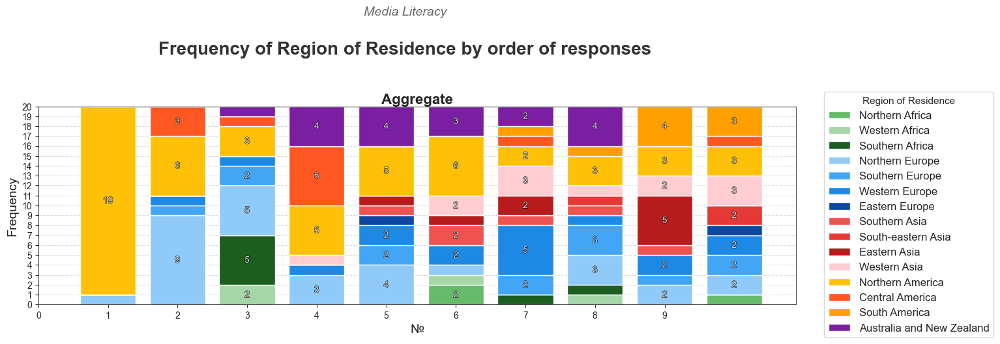

In [ ]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.country2short)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region of Residence'] = df['Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Region of Residence',
    space=0.35, ylim=6, bar_labels=True, dataset=dataset,
    figsize=(15,20), grid=True, legend=False
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Region of Residence', aggregate=True,
    space=0.35, ylim=20, bar_labels=True, dataset=dataset,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Age and Country of Residence

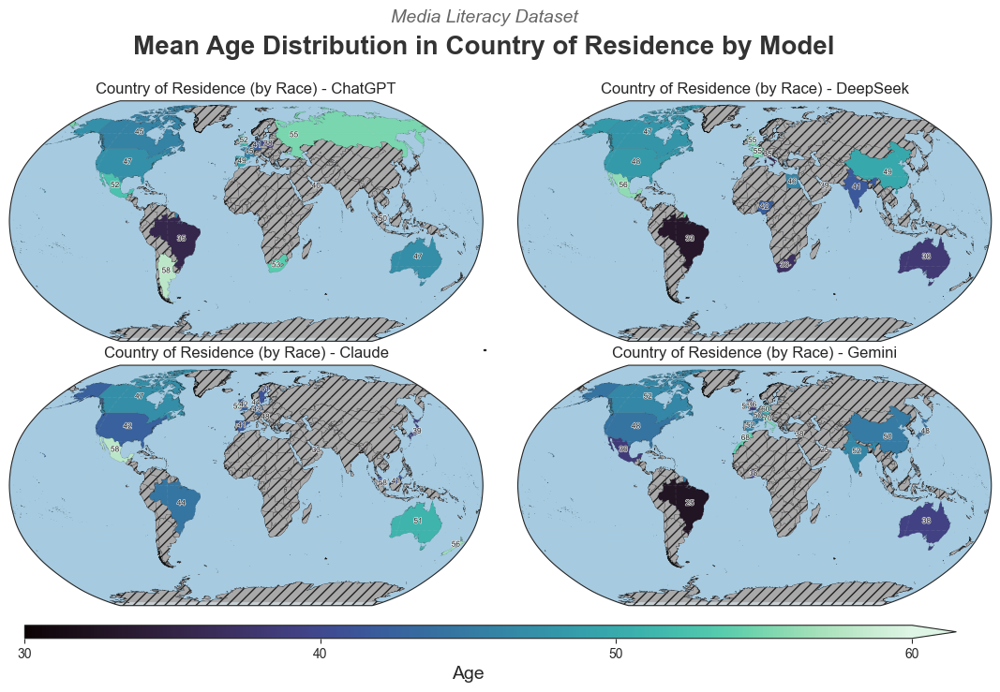

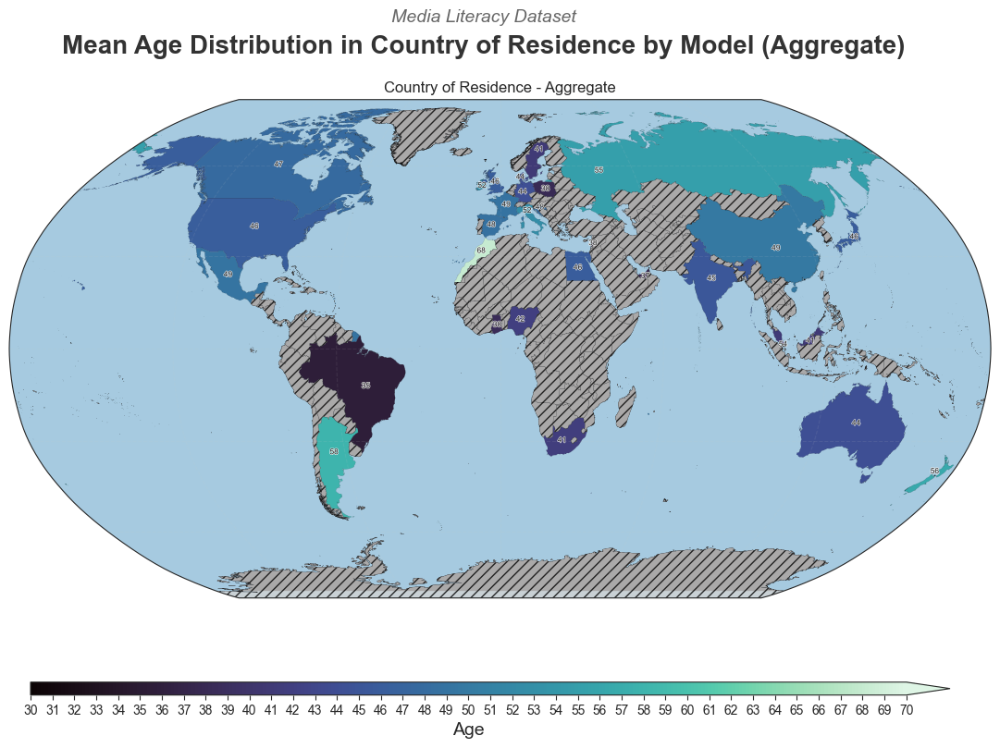

In [ ]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = dfs[dataset][model]
    df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Country of Residence', y='Age',
        title=f'Country of Residence (by Race) - {model}',
        cmap='mako', ax=axs[i%2][i//2], step=10,
        low_poly=False, log=False, show_labels=True,
        max_count=60, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Mean Age Distribution in Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

df = pd.concat([dfs[dataset][model] for model in models], ignore_index=True)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Country of Residence',y='Age',
    title=f'Country of Residence - Aggregate',
    cmap='mako', ax=ax, step=1,
    low_poly=False, log=False, show_labels=True,
    max_count=60, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Mean Age Distribution in Country of Residence by Model (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

ValueError: Invalid bbox: True

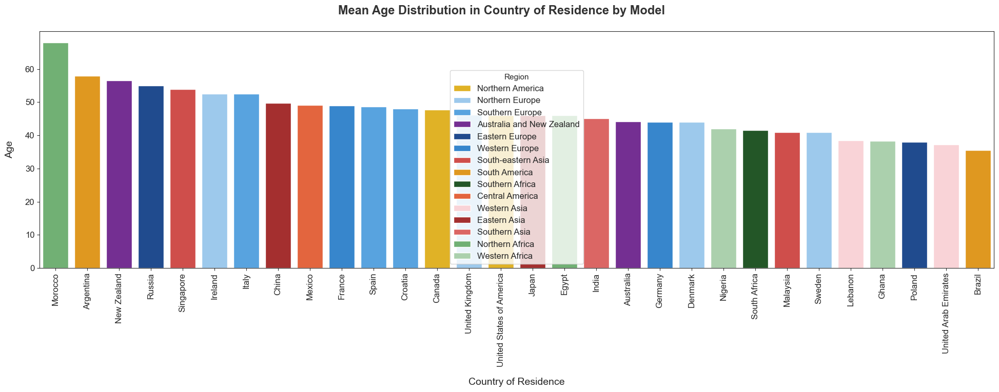

In [ ]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.country2short)
df['Country of Residence'] = df['Country of Residence'].apply(countryHelper.fix_country_naming)
df['Country of Origin'] = df['Race'].apply(countryHelper.race2country)

df_2 = countryHelper.get_country_average_y(df,x='Country of Residence',y='Age')
df_2['Continent'] = df_2['Country of Residence'].apply(lambda x: countryHelper.country2region(x)['region'])
df_2['Region'] = df_2['Country of Residence'].apply(lambda x: countryHelper.country2region(x)['subregion'])
plt = histogram.draw(
    df=df_2,x='Country of Residence', y='Age',
    hue='Region', ylim=60, ystep=10,
    dataset=dataset, aggregate=True,
    long_layout=True, legend=True,
    xtick_label_max_len=30, title_size=17,
    figsize=(9,9)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Employment by Subsector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:545: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


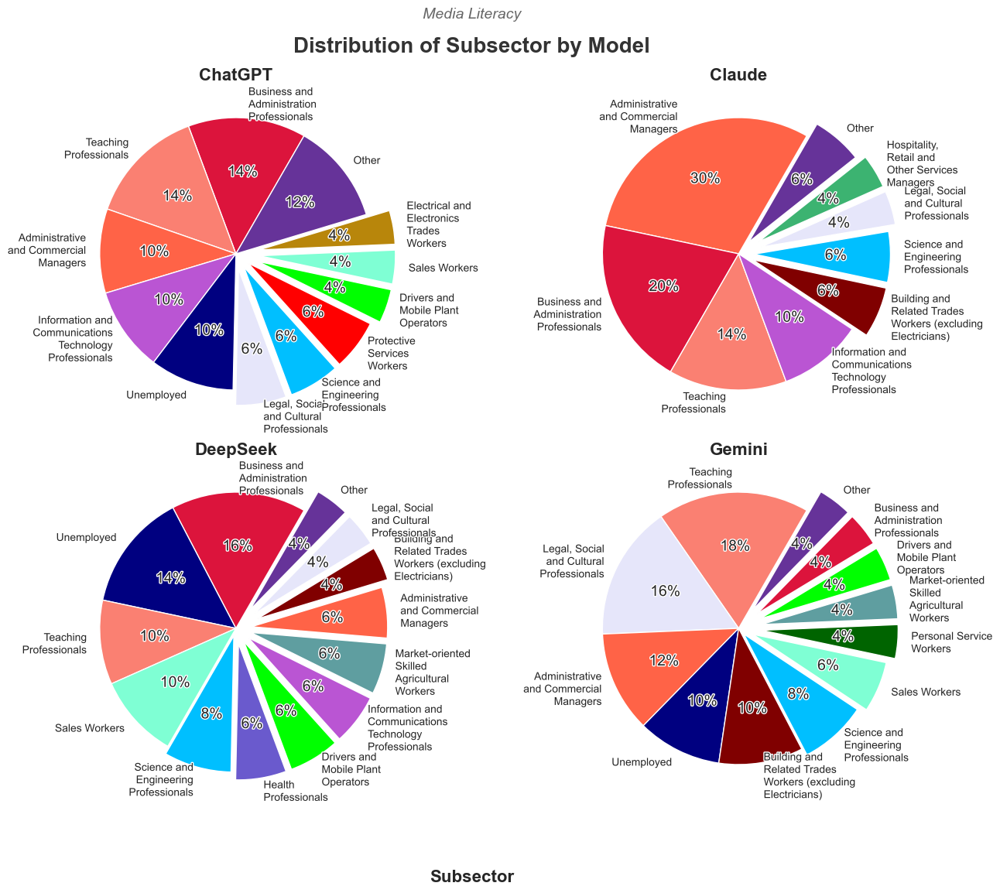

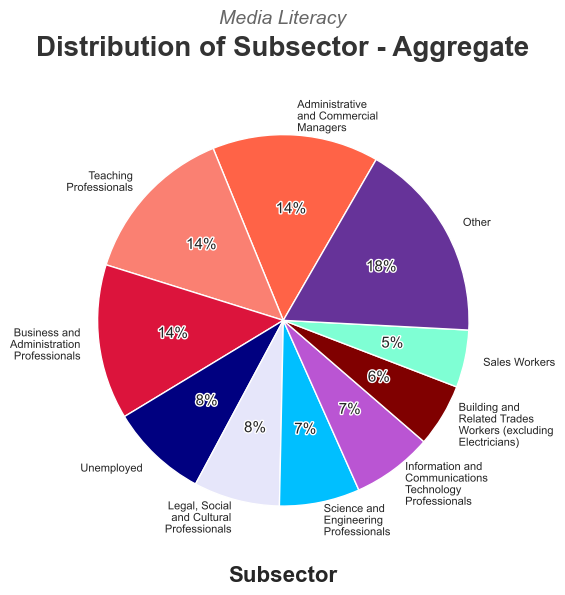

In [ ]:
import os
import pandas as pd
from draw import Histogram, Piechart, Map
from helper import CountryHelper,JobHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]
dataset = "Media Literacy"
piechart = Piechart(models)

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

#Make piechart function for each gender's employment/education
jobHelper = JobHelper()
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sector'] = df['Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Subsector'] = df['Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Subsector",
    dataset=dataset,
    aggregate=False, other=0.04,
    text_width=15, rotation=60, space=0.1,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Subsector",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=60,
    figsize=(6,6),
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:310: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


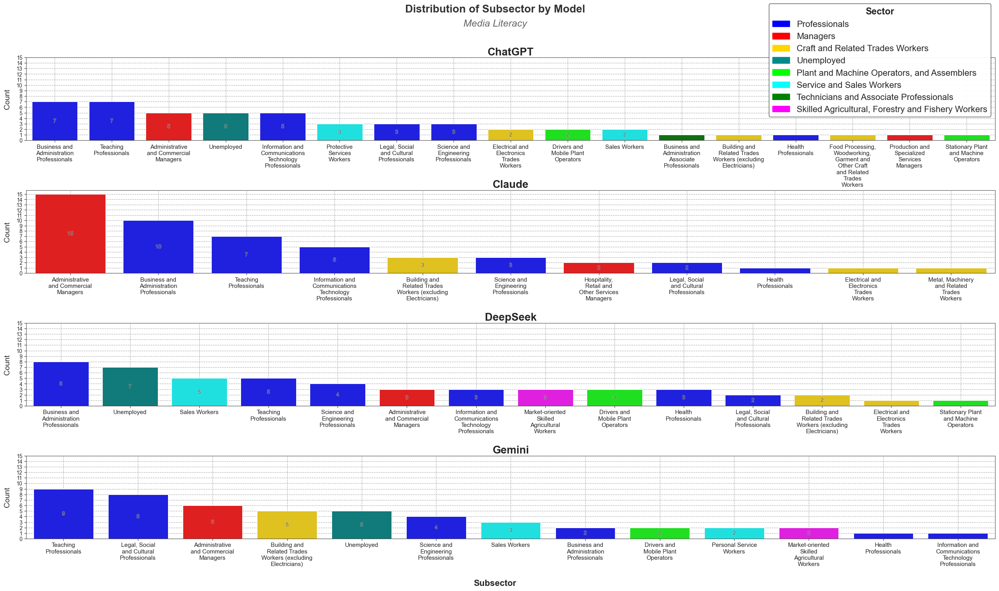

In [ ]:
import os
import pandas as pd
from draw import Histogram, Piechart, Map
from helper import CountryHelper,JobHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]
piechart = Piechart(models)
dataset = "Media Literacy"

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

#Make piechart function for each gender's employment/education
jobHelper = JobHelper()
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sector'] = df['Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Subsector'] = df['Employment'].apply(lambda job: jobHelper.employment2subsector(job))

histogram = Histogram(models)
plt = histogram.draw(
    df,x='Subsector', hue='Sector',
    dataset=dataset,legend=(1,1.7),
    aggregate=False,long_layout=True,
    rotation=0, text_width=15, bar_labels=True,
    hspace=0.6,figsize=(32,16),
    title_size=20, grid=True
    # xtick_label_max_len=25
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Employment by Sector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:548: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


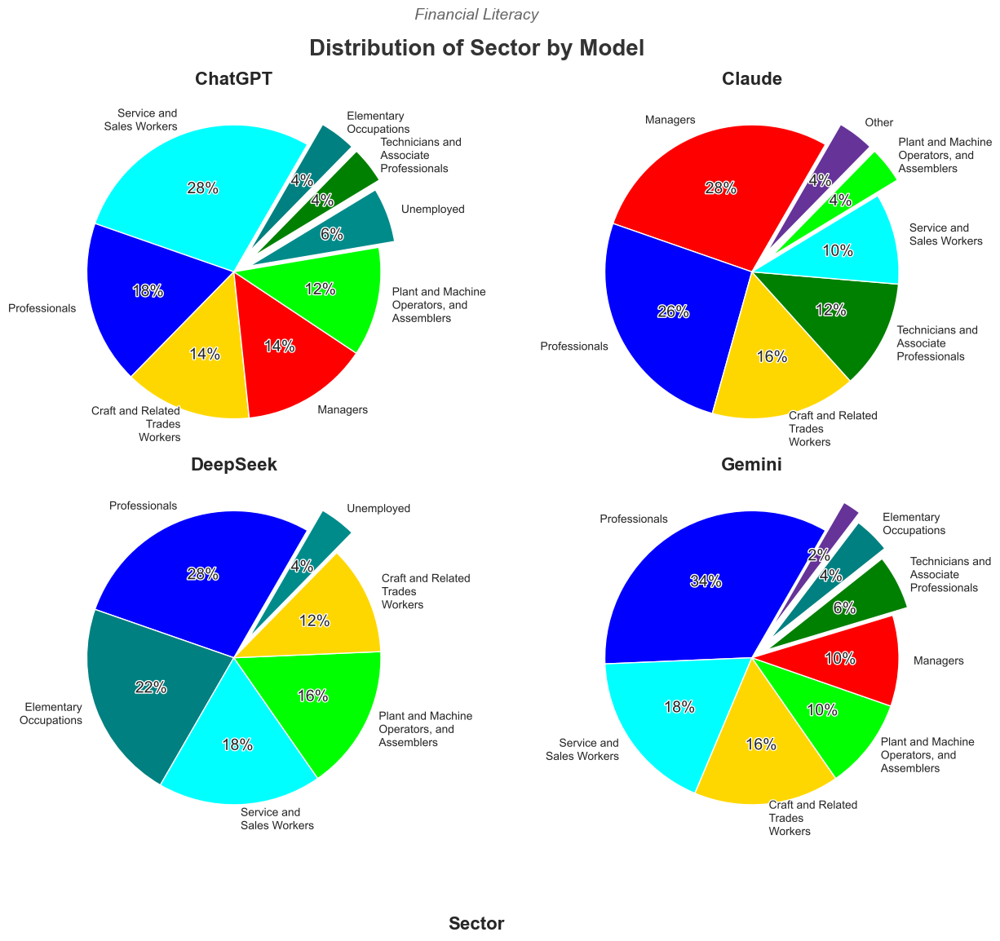

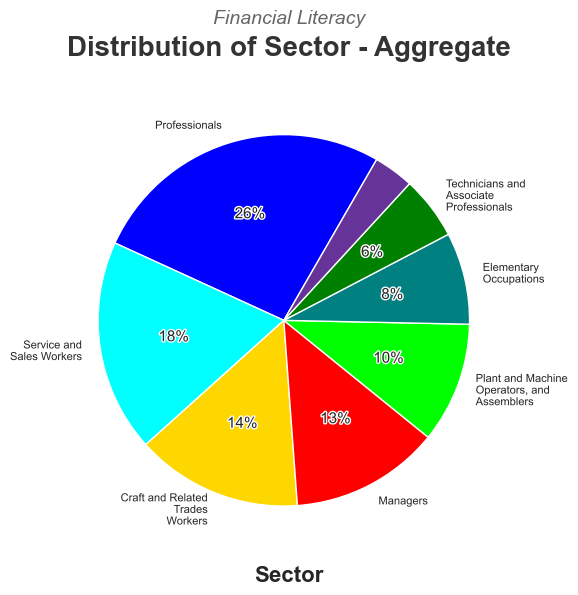

In [ ]:
import os
import pandas as pd
from draw import Histogram, Piechart, Map
from helper import CountryHelper,JobHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]
piechart = Piechart(models)
dataset = "Media Literacy"

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

#Make piechart function for each gender's employment/education
jobHelper = JobHelper()
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sector'] = df['Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Subsector'] = df['Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Sector",
    dataset=dataset,
    aggregate=False, other=0.04, space=0.05,
    text_width=15, rotation=60
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Sector", figsize=(6,6),
    dataset=dataset,
    aggregate=True, other=0.04,
    space=0.05, text_width=15, rotation=60,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Age, Education, Gender (BarChart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#8

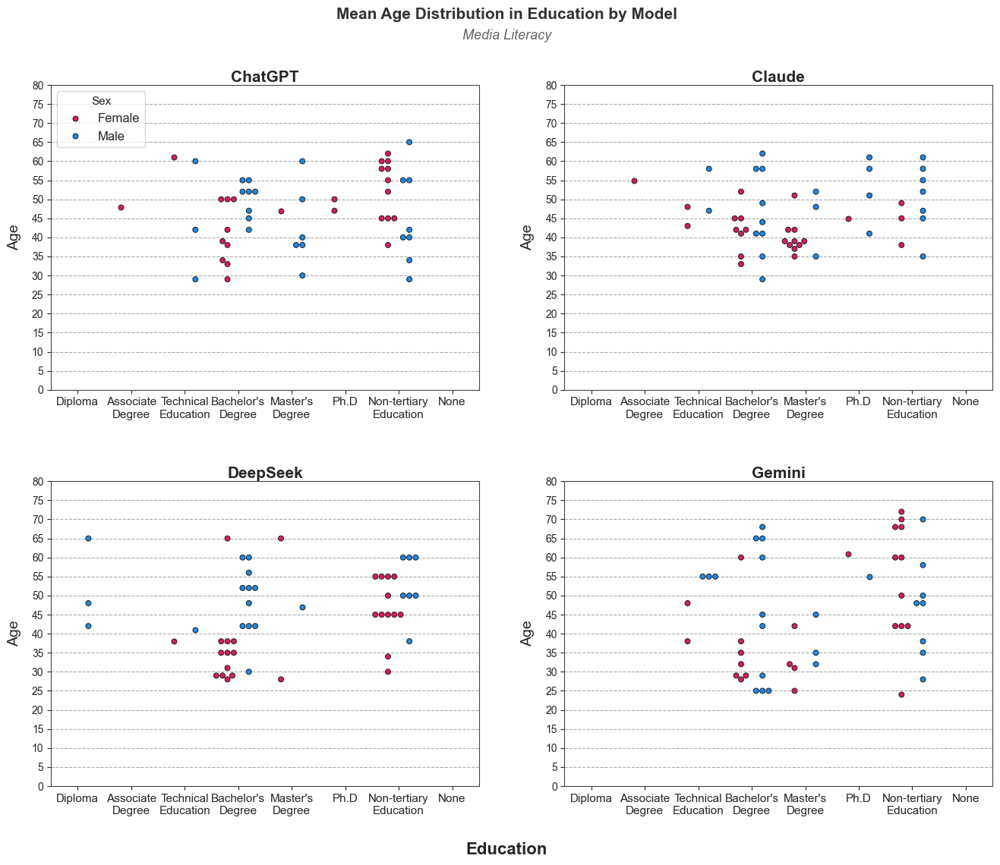

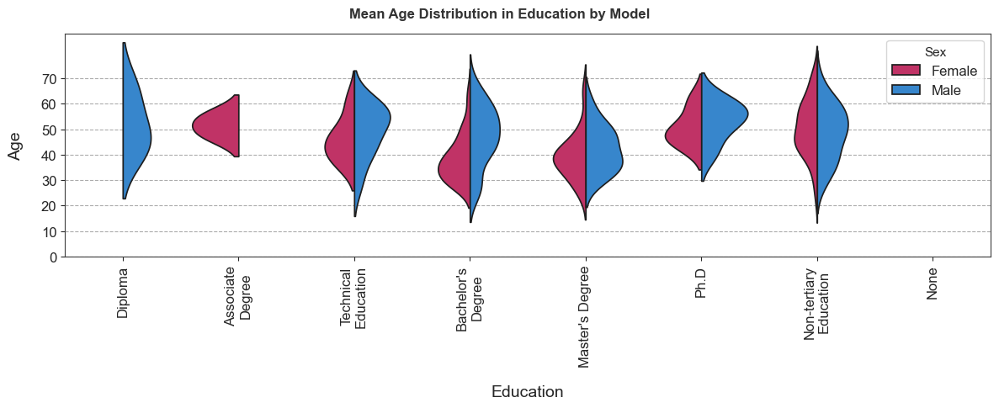

In [ ]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Education'] = df['Education'].apply(jobHelper.education2certification)
df['Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Education',
    hue='Sex',y='Age',
    dataset=dataset,
    aggregate=False, text_width=12,
    rotation=0, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(16,12), grid=True, title_size=15
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Education',
    hue='Sex',y='Age',
    dataset=dataset,
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Age, Employment, Gender (BarChart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:292: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#8

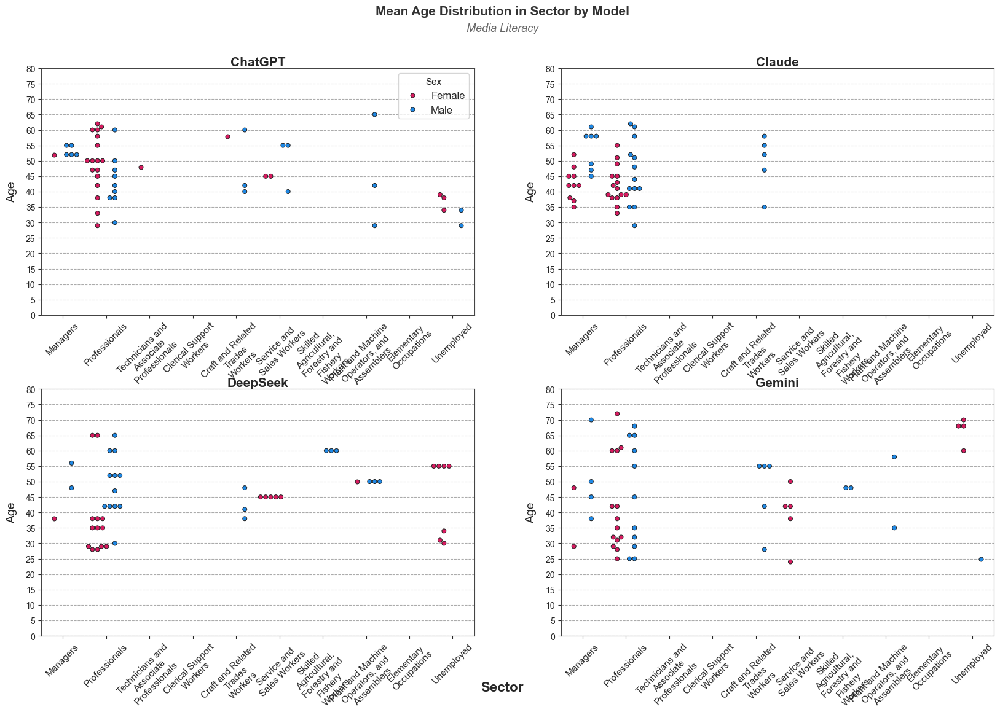

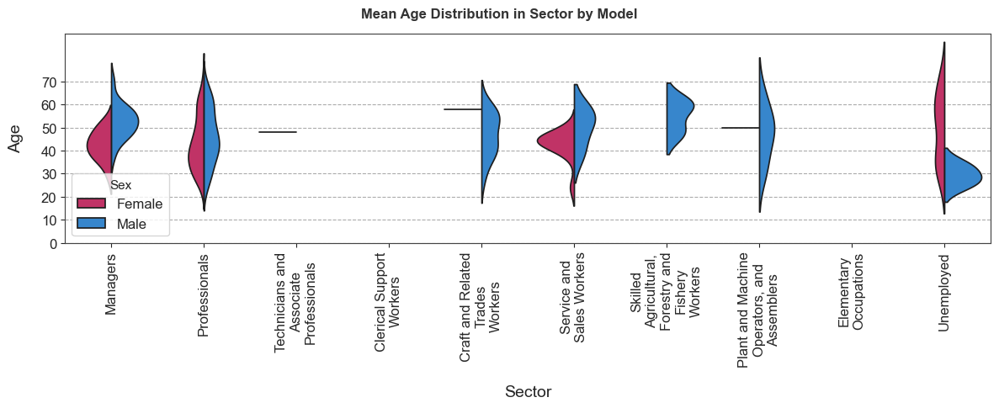

In [ ]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sector']    = df['Employment'].apply(jobHelper.employment2sector)   
df['Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Sector',
    hue='Sex',y='Age',
    dataset=dataset,
    aggregate=False, text_width=15,
    rotation=45, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(20,12), grid=True, title_size=15,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Sector',
    hue='Sex',y='Age',
    dataset=dataset,
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Gender and Employment (Piechart)

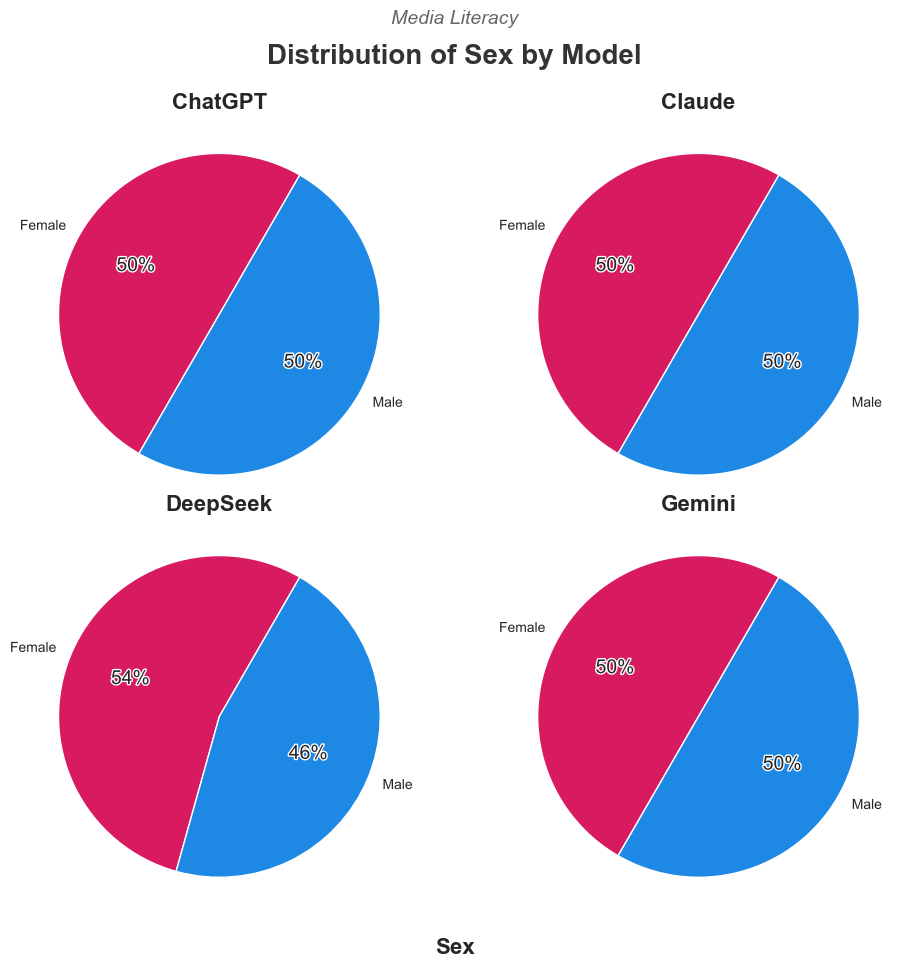

In [ ]:
import os
import pandas as pd
from draw import Histogram, Piechart, Map
from helper import CountryHelper,JobHelper, SexHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]
piechart = Piechart(models)
dataset = "Media Literacy"

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

#Make piechart function for each gender's employment/education
jobHelper = JobHelper()
sexHelper = SexHelper()

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = piechart.draw(
    df, x="Sex",
    dataset=dataset,
    aggregate=False, other=0.04,
    text_width=15, rotation=60,
    figsize=(10,10),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Gender and order of responses (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:843: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


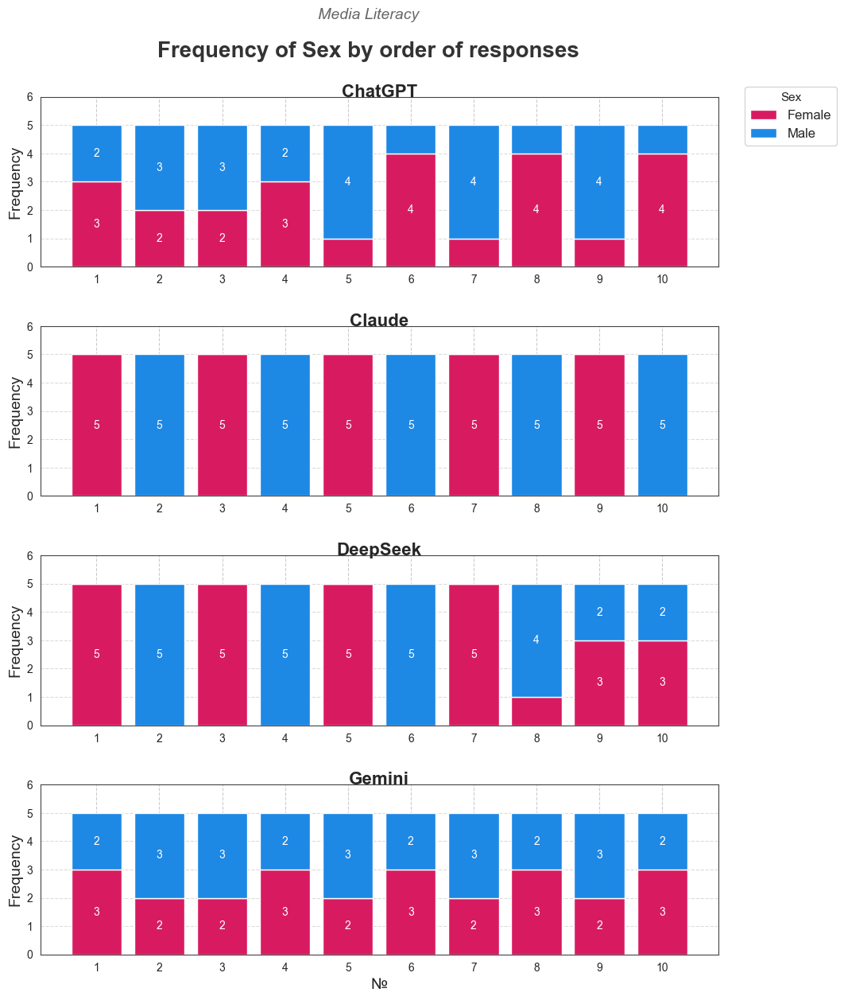

In [ ]:
dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sector'] = df['Employment'].apply(jobHelper.employment2sector)
df['Subsector'] = df['Employment'].apply(jobHelper.employment2subsector)
df['Sex'] = df['Sex'].apply(sexHelper.sex2standard)


plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Sex',
    space=0.35, ylim=6, bar_labels=True,
    figsize=(11,14), grid=True,dataset=dataset
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

### Gender and Employment (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:853: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


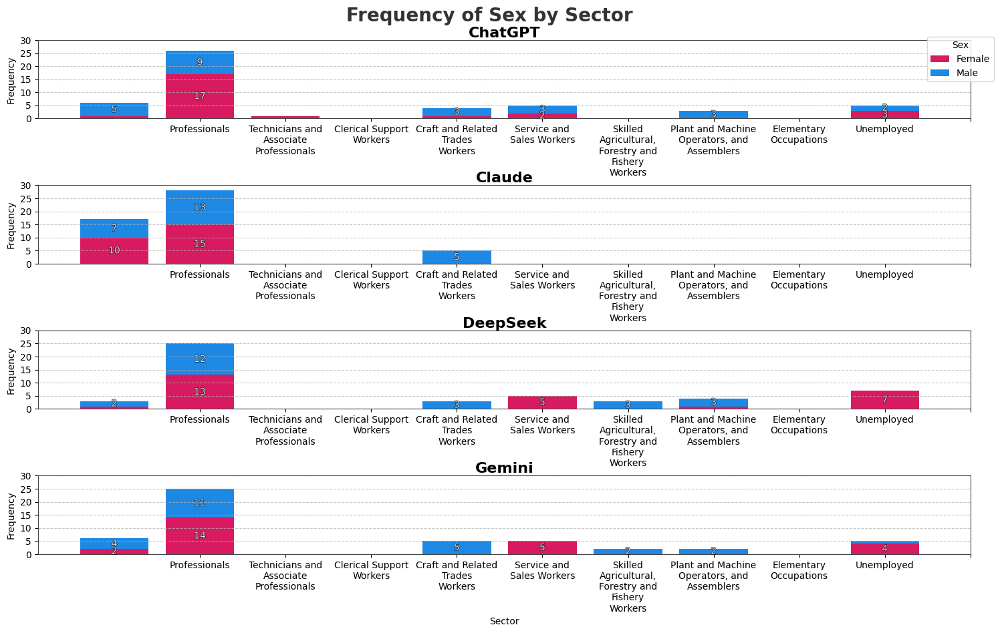

{0: 'Female', 1: 'Male'}


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:853: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


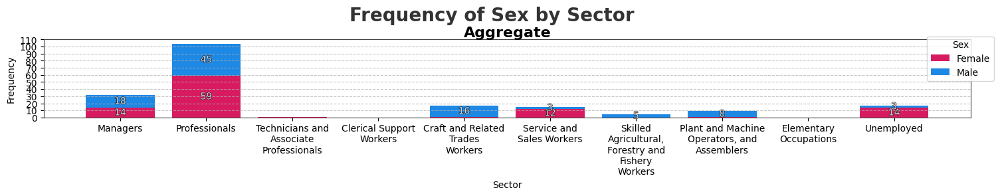

In [ ]:
from draw import squeeze_text
dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sector']    = df['Employment'].apply(jobHelper.employment2sector)   
df['Subsector'] = df['Employment'].apply(jobHelper.employment2subsector)
df['Sex'] = df['Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='Sector',stacked_hue='Sex', grid=True,
    space=0.85, ylim=30, ystep=5,bar_labels=True,
    txt_width=15, figsize=(18,10),
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()


plt = stackedBar.draw(
    df=df,x='Sector',stacked_hue='Sex', grid=True, 
    space=0.85, ylim=110, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True,
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()


### Gender and Age (Population Pyramid)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:569: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:607: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:609: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupb

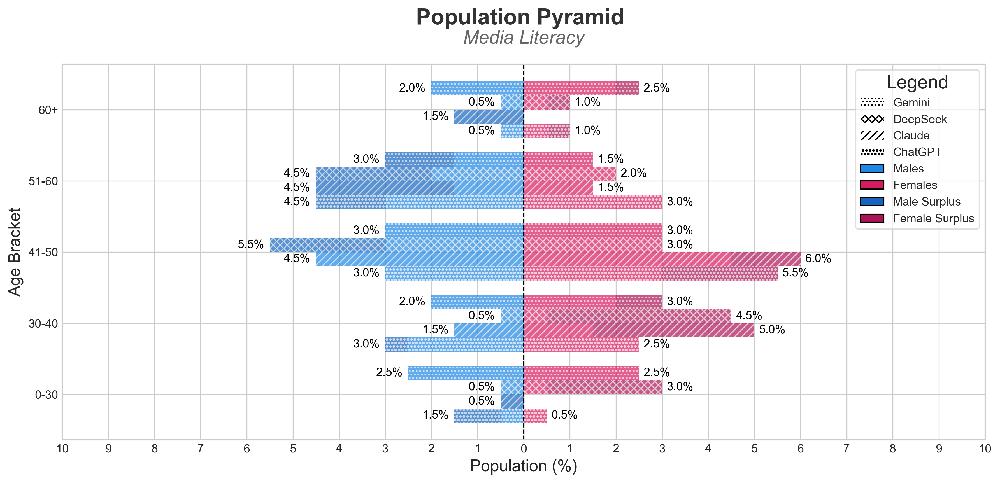

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:569: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:576: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  males   = df[df[stacked_hue] == 'Male'  ].groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:577: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future de

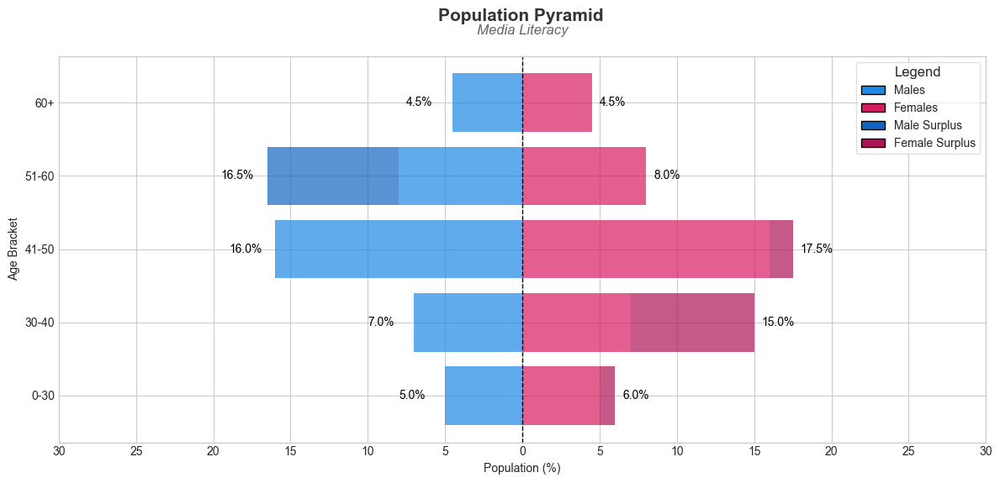

In [ ]:
dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Sex'] = df['Sex'].apply(sexHelper.sex2standard)


xlabels = ['0-30', '30-40', '41-50', '51-60', '60+']
df['Age Bracket'] = pd.cut(df['Age'], bins=[0, 30, 40, 50, 60, 100], labels=xlabels)

from draw import PopulationPyramid
pPyramid = PopulationPyramid(models=models)

plt = pPyramid.draw(
    df=df,x='Age Bracket',stacked_hue='Sex',dataset=dataset,
    xlabels=xlabels,aggregate=False, fontsize=14, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

plt = pPyramid.draw(
    df=df,x='Age Bracket',stacked_hue='Sex',dataset=dataset,
    xlabels=xlabels,aggregate=True, xlim=30, xstep=5, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data',f"{randint(0,100000)}"), dpi=300, bbox_inches='tight')
plt.show()

